This notebook contains strong convergence by refining pathwise. 

In [1]:
import jax
import jax.numpy as jnp
import matplotlib.pyplot as plt
from ipywidgets import interact
from ml_collections import ConfigDict
from models.ETD_KT_CM_JAX_Vectorised import *
from filters import resamplers
from filters.filter import ParticleFilter
from jax import config
from jax import vmap
config.update("jax_enable_x64", True)
import scienceplots
plt.style.use(['science','ieee'])

True


# here we generate the driving paths, a sequence of refined DW on an fixed time interval.

In [78]:
key1 = jax.random.PRNGKey(0)
i=8# maximum resolution refinement level
nmin = int(1e2) # minimum number of timesteps 10000
nmax = int(1e2 * 2**i) # maximum number of timesteps
tmax = 0.1 # 0.1 timestep
dt = tmax/nmax # tmax/nmax 
E=1; P=1; # number of particles and number of basis of noise.

dW = jax.random.normal(key1, shape=(nmax, E, P)) # maximumly refined Wiener increments
dW_refine = []; W_refine = []; time_refine = [] # arrays to store the created Wiener increments and their cumulative sums

for l in range(0, i+1):
    nmax = int(1e2 * 2**(l))# the initial one is at lowest resolution 
    time_refine.append( jnp.linspace(0, tmax, nmax) )
    dW_refine.append(dW)
    W_refine.append(jnp.cumsum(dW, axis=0))
    dW = (dW + jnp.roll(dW, -1, axis=0))[::2, :, :]
dW_refine.reverse()
W_refine.reverse()
print(len(time_refine[0]),len(W_refine[0]),len(dW_refine[0]))
print(len(time_refine[-1]),len(W_refine[-1]),len(dW_refine[-1]))

100 100 100
25600 25600 25600


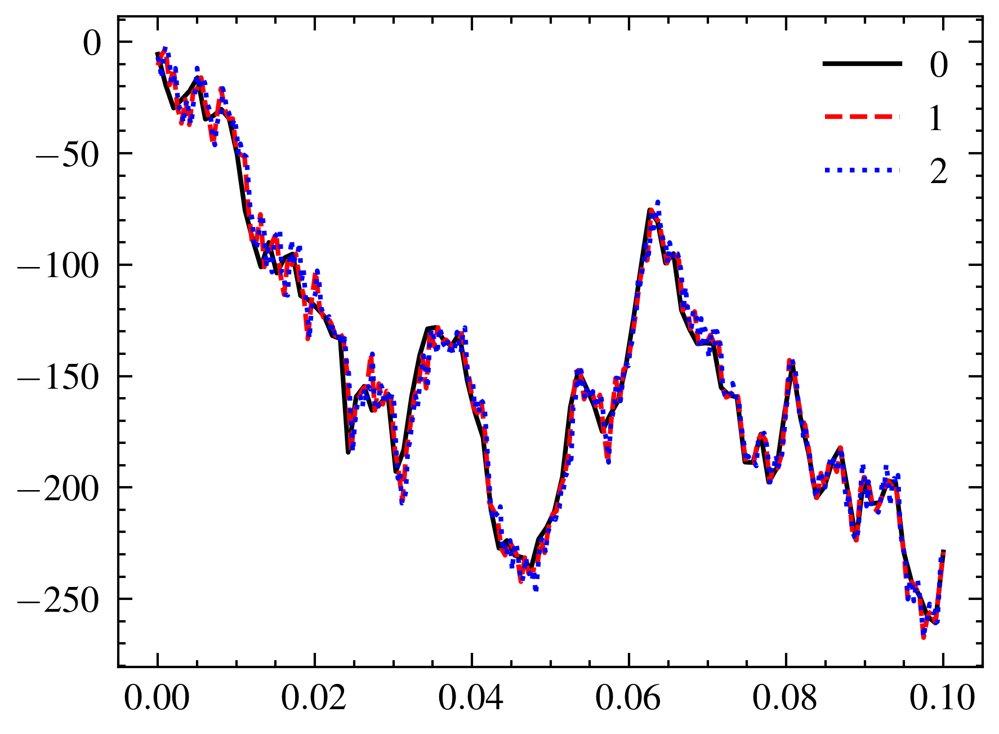

In [79]:
for i in range(0,len(W_refine)-6):
    plt.plot(time_refine[i][:],W_refine[i][:,0,0][:],label=str(i))
plt.legend()


240.48685635845158
0.9394017826502015
131.02168781250833
1.0236069360352211
59.61968907602204
0.9315576418128444
30.395357578302264
0.9498549243219455
15.859399477906582
0.9912124673691614
7.948137161949745
0.9935171452437181
3.9632171468087374
0.9908042867021843
2.003041028034453
1.0015205140172263
1.0047123821996027
1.0047123821996027


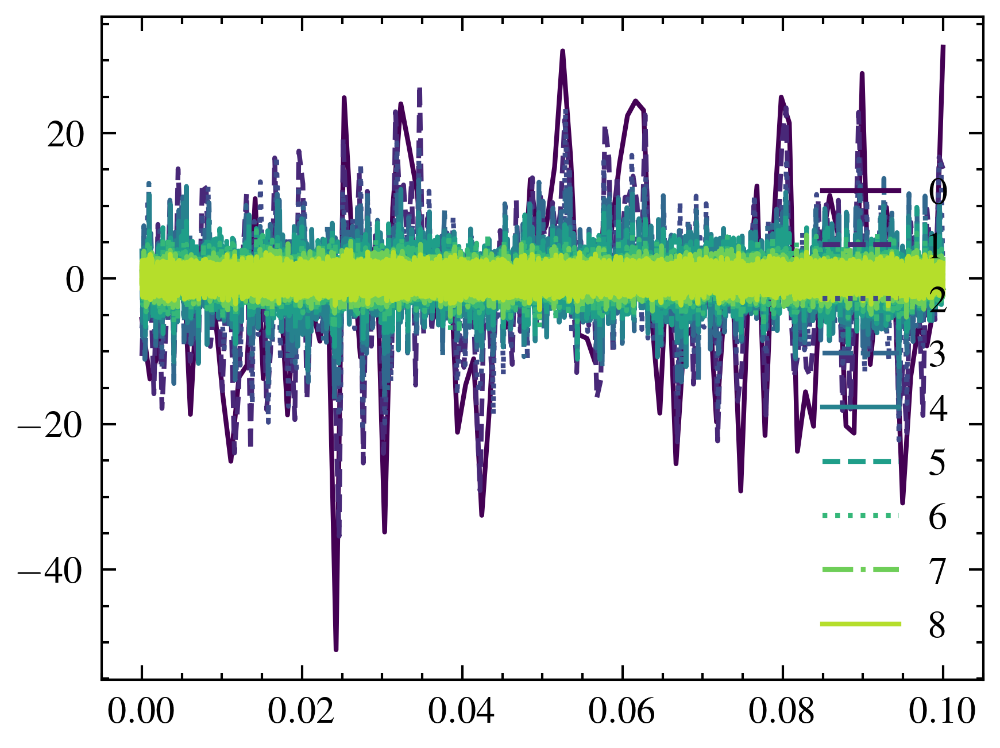

In [80]:
for i in range(0,len(W_refine)):
    #time = jnp.linspace(0, tmax, 2**(i))
    plt.plot(time_refine[i], dW_refine[i][:,0,0], label=str(i), color=plt.cm.viridis(i / len(W_refine)))
plt.legend()
for i in range(0,len(W_refine)):
    print(jnp.var(dW_refine[i][:,0,0]))# 256. 
    print(jnp.var((dW_refine[i][:,0,0]/jnp.sqrt(2**(8-i))) ))


Specify initial setup of the signal, by first loading parameters from the stochastic traveling wave.

In [81]:
signal_params = ConfigDict(KDV_params_exact_traveling)
print(signal_params)

Advection_basis_name: constant
E: 1
Forcing_basis_name: none
P: 1
S: 0
c_0: 0
c_1: 1
c_2: 0.0
c_3: 1
c_4: 0.0
dt: 0.0001
equation_name: KdV
initial_condition: new_traveling_wave
method: Dealiased_SETDRK4
noise_magnitude: 1.0
nx: 64
tmax: 1.0
xmax: 3.141592653589793
xmin: -3.141592653589793



Next, we update the method to have 256 spatial resolution, as to mimimise spatial errors.
We choose $dt = (10^{-5}) i$, for $i=1,...,1/16$. $T_{max} = 0.1$. 

In [82]:
signal_params.update(method='Dealiased_SETDRK4',dt=1e-3,tmax= 0.1,nx = 256,P=1,S=0,noise_magnitude=0.05,initial_condition='very_steep_traveling_wave')

Now we continue to define a stochastic ensemble

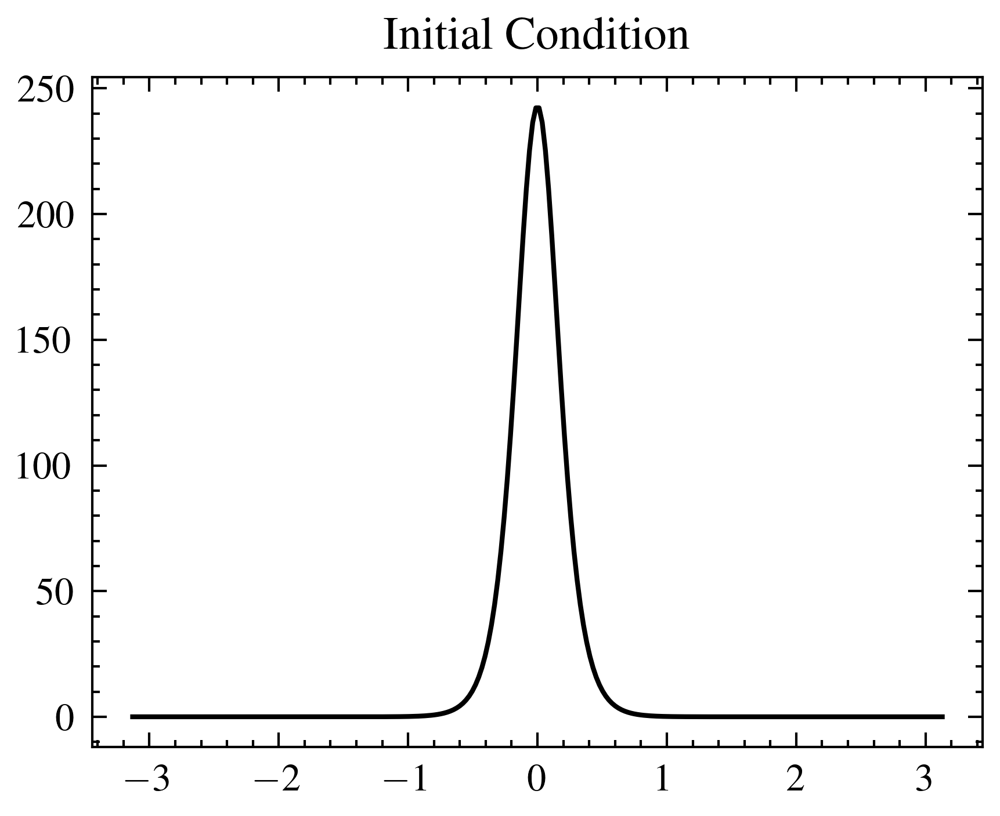

In [83]:
signal_model = ETD_KT_CM_JAX_Vectorised(signal_params)
initial_signal = initial_condition(signal_model.x, signal_params.E, signal_params.initial_condition)
plt.title("Initial Condition")
plt.plot(signal_model.x, initial_signal[0,:])
plt.show()

It is important to note that the $\cosh^2(x)$ travelling wave assumes vanishing contribution at infinity $u=u_x=u_{xxx}=0$ for $x=\pm \infty$.
We are implementing this $\cosh^2(x)$ travelling wave solution with periodic boundary conditions on $x\in [-\pi,\pi]$.
This is technically incorrect, as the wave solution has finite values of $u,u_x,u_{xx}$, at $[-\pi,\pi]$. Resulting in a periodic discontinuity in the first derivative. 


In [84]:
key1 = jax.random.PRNGKey(0)
dW = jax.random.normal(key1, shape=(signal_model.nmax, signal_model.params.E, signal_model.params.P))
dW = dW
print(dW.shape,jnp.amax(dW),jnp.average(dW),jnp.var(dW))
dW = (dW_refine[0]/jnp.sqrt(2**(8-0))) #[:,0,0]# renormalise. 
print(dW.shape,jnp.amax(dW),jnp.average(dW),jnp.var(dW))
# why is this the case?

final, all = signal_model.run(initial_signal, signal_model.nmax, dW) #the final input is scan length? 
print(final.shape,all.shape)
print(initial_signal.shape)
print(all.shape)
signal = jnp.concatenate([initial_signal[None,...], all], axis=0)
print(signal.shape)

(100, 1, 1) 2.5718157985068433 -0.008714484399490421 1.0903675766038357
(100, 1, 1) 1.9907986535512534 -0.14308411760962306 0.9394017826502015
(1, 256) (100, 1, 256)
(1, 256)
(100, 1, 256)
(101, 1, 256)


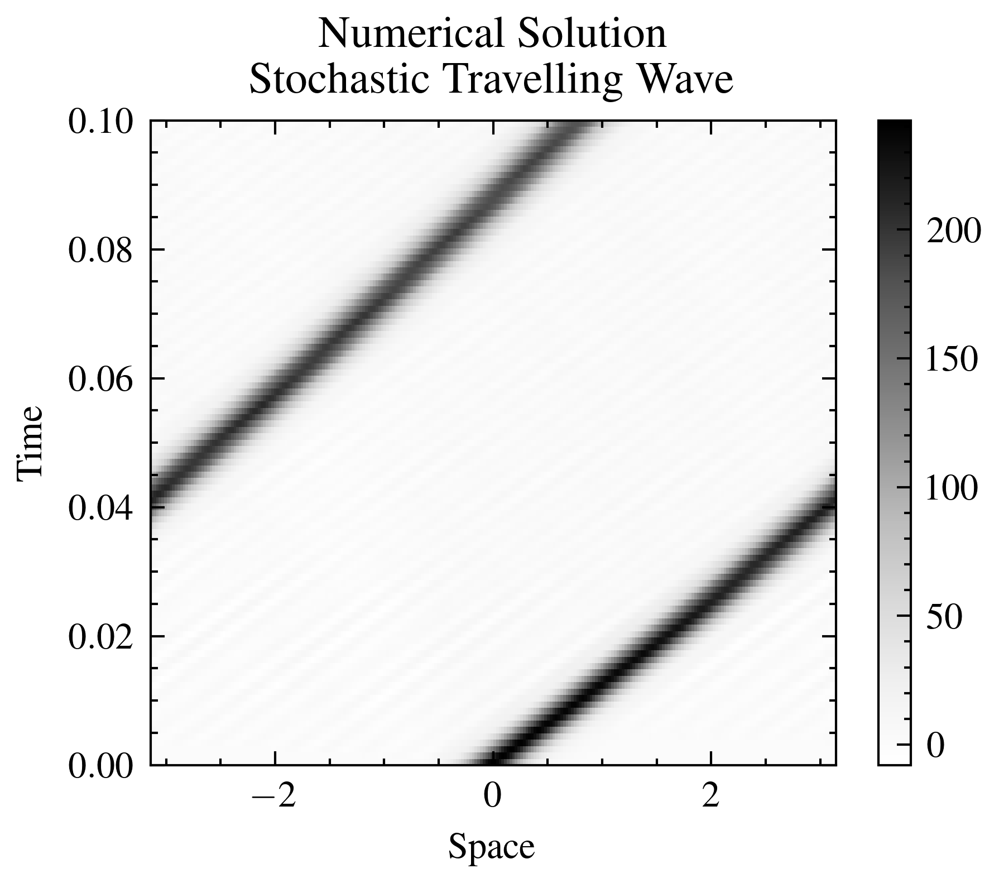

In [85]:
plt.title('Numerical Solution \n Stochastic Travelling Wave')
plt.imshow(signal[:,0,:],extent = [signal_model.params.xmin, signal_model.params.xmax,0,signal_model.params.tmax],aspect='auto',cmap='Grays',origin='lower')
plt.colorbar()
plt.xlabel('Space')
plt.ylabel('Time')
plt.show()

In [86]:
print(type(all))
print(len(all))
print(all[0].shape) # particles
print(all[1].shape) # signal

<class 'jaxlib.xla_extension.ArrayImpl'>
100
(1, 256)
(1, 256)


Consider the stochastic KdV equation 
\begin{align}
d u + uu_x + u_{xxx} + \xi u_x \circ dW = 0.
\end{align}
Define the stochastic moving frame $X(t,x) = x - \xi W(t)$, $dX = \xi dW$, it is a stochastic process.
Define a new function in the moving frame $v(t,X(t,x)) = u(t,x)$. Such that 
\begin{align}
du = dv(t,X(t,x)) = \partial_t v - \frac{\partial v}{\partial X} \xi dW  = \partial_t v - \frac{\partial u}{\partial x} \xi dW
\end{align}
Transforms the stochastic KdV equation, into a deterministic pde, such that one can derive 
$\cosh^2( (x - 4 \beta^2 t_n - \frac{1}{2} W(t_n)) $

In [87]:

W = jnp.cumsum(dW, axis=0)
W = jnp.sqrt(signal_model.params.dt) * signal_model.params.noise_magnitude * W
print(W.shape)
W_new = jnp.zeros([signal_model.nmax+1, signal_model.params.E, signal_model.params.P])
W_new = W_new.at[1:,:,:].set(W)

E = signal_model.params.E
nmax = signal_model.nmax
nx = signal_model.params.nx
x = signal_model.x
xmax = signal_model.params.xmax
xmin = signal_model.params.xmin
dt = signal_model.params.dt

analytic = jnp.zeros([nmax+1, E, nx])

initial_condition_jitted = jax.jit(initial_condition, static_argnums=(1,2))# jitted with last two arguments frozen
def compute_ans(n, x, dt, W_new, xmax, E, initial_condition):
    # ensure that the initial condition is correctly a
    return initial_condition_jitted((x - 9 * 9 * (dt * n) - W_new[n, :, :] + xmax) % (xmax * 2) - xmax, E, signal_params.initial_condition)
compute_ans_vmap = vmap(compute_ans, in_axes=(0, None, None, None, None, None, None))
# Generate the range of n values
n_values = jnp.arange(signal_model.nmax + 1)
# Compute analytic using the vectorized function
analytic = compute_ans_vmap(n_values, x, dt, W_new, xmax, E, signal_params.initial_condition)
# evaluation takes a couple of mins at higher resolution. as compared with the numerical implementation, which is fast


(100, 1, 1)


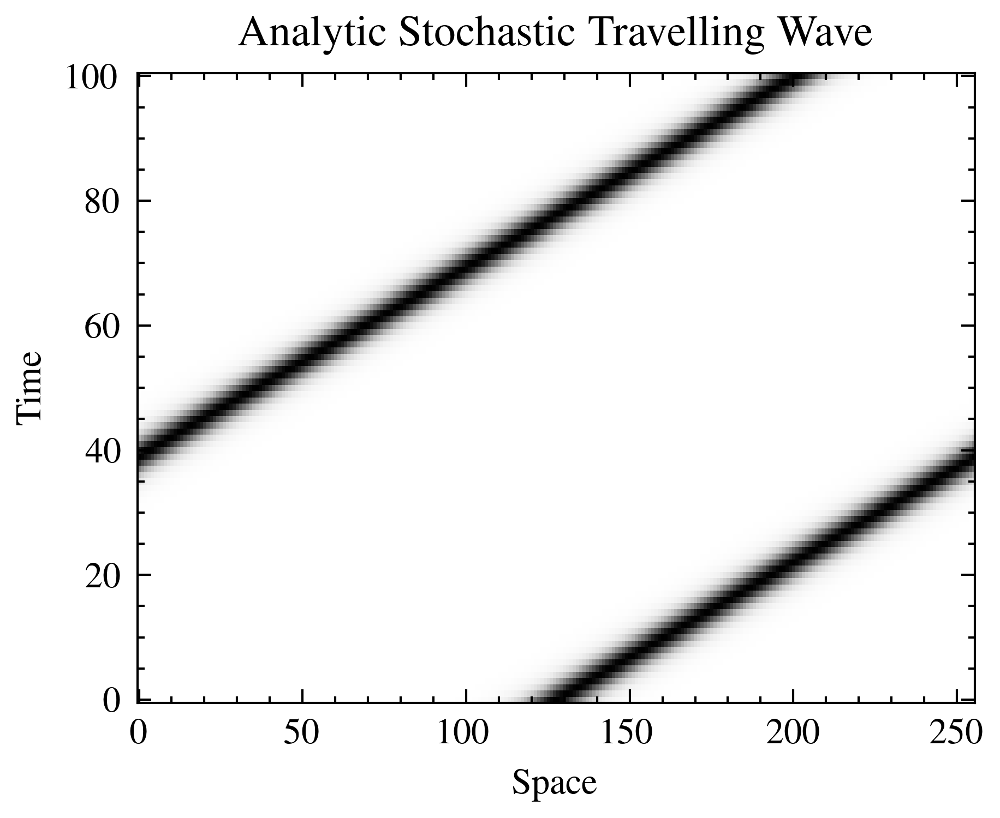

In [88]:
plt.title('Analytic Stochastic Travelling Wave')
plt.imshow(analytic[:,0,:],aspect='auto',cmap='Grays',origin='lower')
plt.xlabel('Space')
plt.ylabel('Time')
plt.show()

In [89]:
def plot(da_step):
    plt.title(f"da_step = {da_step}")
    plt.plot(signal_model.x, signal[da_step,:,:].T, color='k',linewidth=0.2,label='signal')
    plt.plot(signal_model.x, analytic[da_step,:,:].T, color='r',linewidth=0.2,label='analytic')
    plt.legend()
    plt.show()
print(signal.shape,analytic.shape)
interact(plot, da_step=(0, signal_model.nmax))


(101, 1, 256) (101, 1, 256)


interactive(children=(IntSlider(value=50, description='da_step'), Output()), _dom_classes=('widget-interact',)…

<function __main__.plot(da_step)>

We plot the difference between numerical and analytic solutions

In [90]:
def plot(da_step):
    plt.title('Difference between numerical and analytic solutions')
    plt.plot(signal_model.x, signal[da_step,:,:].T-analytic[da_step,:,:].T, color='k',linewidth=2)
    plt.legend(['signal'])
    plt.show()
print(signal.shape,analytic.shape)
interact(plot, da_step=(0, signal_model.nmax))

(101, 1, 256) (101, 1, 256)


interactive(children=(IntSlider(value=50, description='da_step'), Output()), _dom_classes=('widget-interact',)…

<function __main__.plot(da_step)>

In [91]:
def relative_error(signal, analytic):
    return jnp.linalg.norm(signal-analytic)/jnp.linalg.norm(analytic)

print( jnp.linalg.norm(signal[1,:,:]- analytic[1,:,:]))# this should be zero
print(relative_error(signal[:,:,:], analytic[:,:,:]))#space time relative error.

17.46755934355351
0.8890210811561239


Here we try and produce all the plots in one sweep, rather than rerunning seperately. 

0
0.001
1
0.0005
2
0.00025
3
0.000125
4
6.25e-05
5
3.125e-05
6
1.5625e-05
7
7.8125e-06


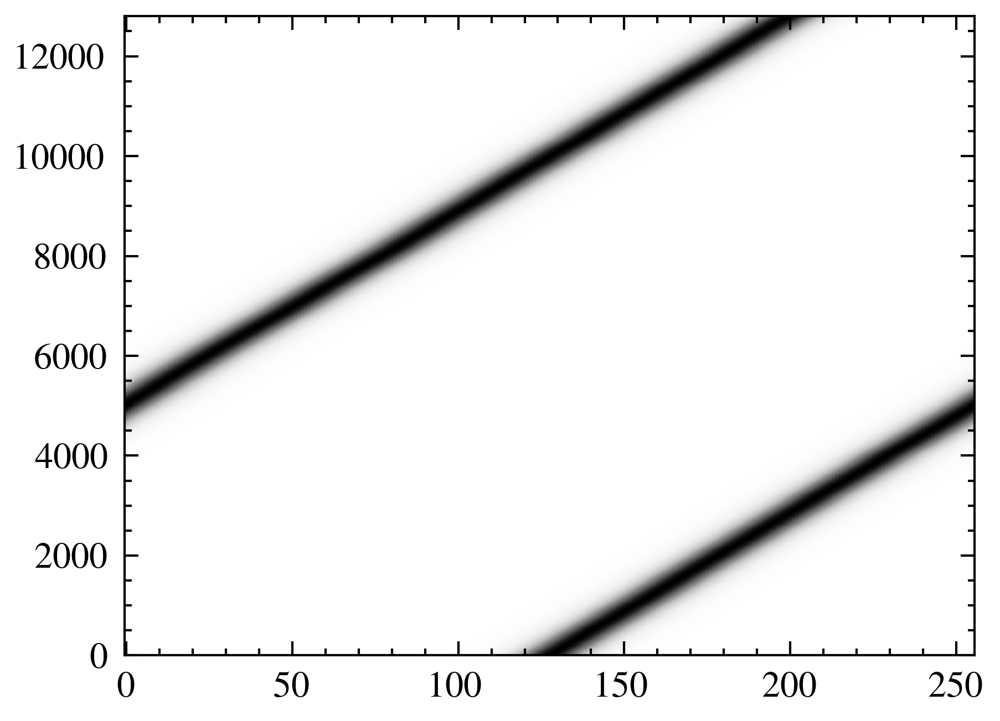

In [92]:
array = jnp.zeros(8)
for i in range(8):
    signal_params = ConfigDict(KDV_params_exact_traveling)
    signal_params.update(E=1,method='Dealiased_SETDRK4',dt= 1e-3*1/2**i,tmax=0.1,nx=256,P=1,S=0,noise_magnitude=0.1,initial_condition='very_steep_traveling_wave')
    print(i)
    signal_model = ETD_KT_CM_JAX_Vectorised(signal_params)
    initial_signal = initial_condition(signal_model.x, signal_params.E, signal_params.initial_condition)
    dW =(dW_refine[i]/jnp.sqrt(2**(8-i))) #[:,0,0]# renormalise.
    final, all = signal_model.run(initial_signal, signal_model.nmax, dW) #the final input is scan length? 
    plt.imshow(all[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    signal = jnp.concatenate([initial_signal[None,...], all], axis=0)# key

    W = jnp.cumsum(dW, axis=0)
    W = jnp.sqrt(signal_model.params.dt) * signal_model.params.noise_magnitude * W
    W_new = jnp.zeros([signal_model.nmax+1, signal_model.params.E, signal_model.params.P])
    W_new = W_new.at[1:,:,:].set(W)

    E = signal_model.params.E
    nmax = signal_model.nmax
    nx = signal_model.params.nx
    x = signal_model.x
    xmax = signal_model.params.xmax
    xmin = signal_model.params.xmin
    dt = signal_model.params.dt
    print(dt)
    analytic = jnp.zeros([nmax+1, E, nx])
    
    initial_condition_jitted = jax.jit(initial_condition, static_argnums=(1,2))# jitted with last two arguments frozen
    def compute_ans(n, x, dt, W_new, xmax, E, initial_condition):
        return initial_condition_jitted((x - 9 * 9 * (dt * n) - W_new[n, :, :] + xmax) % (xmax * 2) - xmax, E, signal_params.initial_condition)
    compute_ans_vmap = vmap(compute_ans, in_axes=(0, None, None, None, None, None, None))
    # Generate the range of n values
    n_values = jnp.arange(signal_model.nmax + 1)
    # Compute analytic using the vectorized function
    analytic = compute_ans_vmap(n_values, x, dt, W_new, xmax, E, signal_params.initial_condition)


    def relative_error(signal, analytic):
        return jnp.linalg.norm(signal-analytic)/jnp.linalg.norm(analytic)
    
    array = array.at[i].set( relative_error(signal[:,:,:], analytic[:,:,:]) )
plt.show()

0
0.001
1
0.0005
2
0.00025
3
0.000125
4
6.25e-05
5
3.125e-05
6
1.5625e-05
7
7.8125e-06


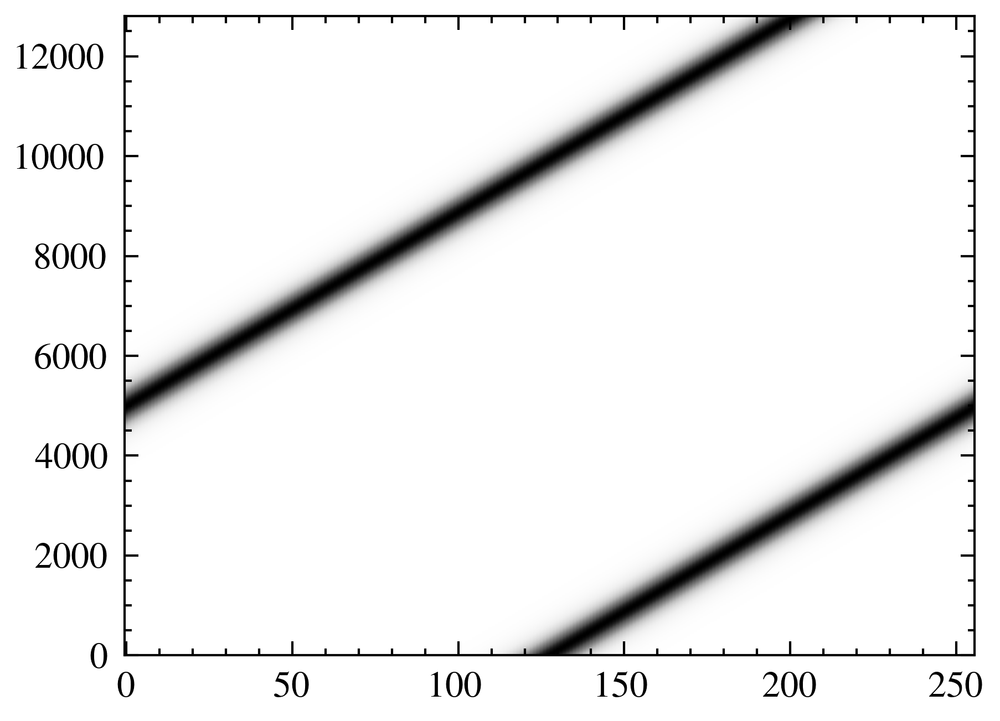

In [93]:
array_0pt02 = jnp.zeros(8)
for i in range(8):
    signal_params = ConfigDict(KDV_params_exact_traveling)
    signal_params.update(E=1,method='Dealiased_SETDRK4',dt= 1e-3*1/2**i,tmax=0.1,nx=256,P=1,S=0,noise_magnitude=0.01,initial_condition='very_steep_traveling_wave')
    print(i)
    signal_model = ETD_KT_CM_JAX_Vectorised(signal_params)
    initial_signal = initial_condition(signal_model.x, signal_params.E, signal_params.initial_condition)
    dW =(dW_refine[i]/jnp.sqrt(2**(8-i))) #[:,0,0]# renormalise.
    final, all = signal_model.run(initial_signal, signal_model.nmax, dW) #the final input is scan length? 
    plt.imshow(all[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    signal = jnp.concatenate([initial_signal[None,...], all], axis=0)# key

    W = jnp.cumsum(dW, axis=0)
    W = jnp.sqrt(signal_model.params.dt) * signal_model.params.noise_magnitude * W
    W_new = jnp.zeros([signal_model.nmax+1, signal_model.params.E, signal_model.params.P])
    W_new = W_new.at[1:,:,:].set(W)

    E = signal_model.params.E
    nmax = signal_model.nmax
    nx = signal_model.params.nx
    x = signal_model.x
    xmax = signal_model.params.xmax
    xmin = signal_model.params.xmin
    dt = signal_model.params.dt
    print(dt)
    analytic = jnp.zeros([nmax+1, E, nx])
    
    initial_condition_jitted = jax.jit(initial_condition, static_argnums=(1,2))# jitted with last two arguments frozen
    def compute_ans(n, x, dt, W_new, xmax, E, initial_condition):
        return initial_condition_jitted((x - 9 * 9 * (dt * n) - W_new[n, :, :] + xmax) % (xmax * 2) - xmax, E, signal_params.initial_condition)
    compute_ans_vmap = vmap(compute_ans, in_axes=(0, None, None, None, None, None, None))
    # Generate the range of n values
    n_values = jnp.arange(signal_model.nmax + 1)
    # Compute analytic using the vectorized function
    analytic = compute_ans_vmap(n_values, x, dt, W_new, xmax, E, signal_params.initial_condition)


    def relative_error(signal, analytic):
        return jnp.linalg.norm(signal-analytic)/jnp.linalg.norm(analytic)
    
    array_0pt02 = array_0pt02.at[i].set( relative_error(signal[:,:,:], analytic[:,:,:]) )
plt.show()

0
0.001
1
0.0005
2
0.00025
3
0.000125
4
6.25e-05
5
3.125e-05
6
1.5625e-05
7
7.8125e-06


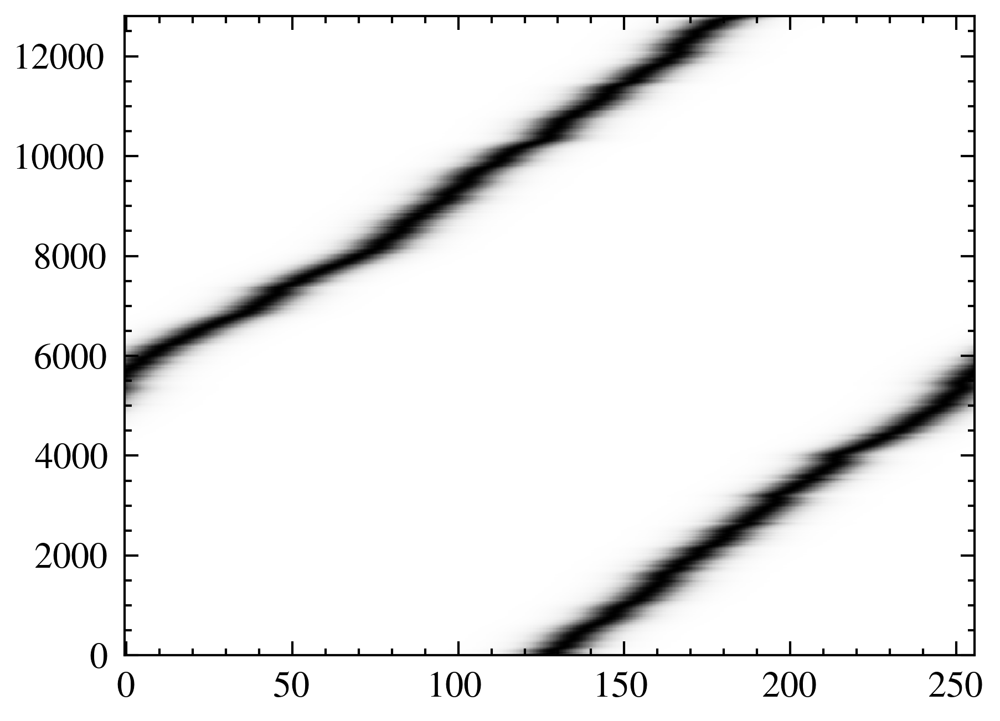

In [94]:
array_2 = jnp.zeros(8)
for i in range(8):
    signal_params = ConfigDict(KDV_params_exact_traveling)
    signal_params.update(E=1,method='Dealiased_SETDRK4',dt= 1e-3*1/2**i,tmax=0.1,nx=256,P=1,S=0,noise_magnitude=1,initial_condition='very_steep_traveling_wave')
    print(i)
    signal_model = ETD_KT_CM_JAX_Vectorised(signal_params)
    initial_signal = initial_condition(signal_model.x, signal_params.E, signal_params.initial_condition)
    dW =(dW_refine[i]/jnp.sqrt(2**(8-i))) #[:,0,0]# renormalise.
    final, all = signal_model.run(initial_signal, signal_model.nmax, dW) #the final input is scan length? 
    plt.imshow(all[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    signal = jnp.concatenate([initial_signal[None,...], all], axis=0)# key

    W = jnp.cumsum(dW, axis=0)
    W = jnp.sqrt(signal_model.params.dt) * signal_model.params.noise_magnitude * W
    W_new = jnp.zeros([signal_model.nmax+1, signal_model.params.E, signal_model.params.P])
    W_new = W_new.at[1:,:,:].set(W)

    E = signal_model.params.E
    nmax = signal_model.nmax
    nx = signal_model.params.nx
    x = signal_model.x
    xmax = signal_model.params.xmax
    xmin = signal_model.params.xmin
    dt = signal_model.params.dt
    print(dt)
    analytic = jnp.zeros([nmax+1, E, nx])
    
    initial_condition_jitted = jax.jit(initial_condition, static_argnums=(1,2))# jitted with last two arguments frozen
    def compute_ans(n, x, dt, W_new, xmax, E, initial_condition):
        return initial_condition_jitted((x - 9 * 9 * (dt * n) - W_new[n, :, :] + xmax) % (xmax * 2) - xmax, E, signal_params.initial_condition)
    compute_ans_vmap = vmap(compute_ans, in_axes=(0, None, None, None, None, None, None))
    # Generate the range of n values
    n_values = jnp.arange(signal_model.nmax + 1)
    # Compute analytic using the vectorized function
    analytic = compute_ans_vmap(n_values, x, dt, W_new, xmax, E, signal_params.initial_condition)


    def relative_error(signal, analytic):
        return jnp.linalg.norm(signal-analytic)/jnp.linalg.norm(analytic)
    
    array_2 = array_2.at[i].set( relative_error(signal[:,:,:], analytic[:,:,:]) )
plt.show()

0 0
0 1
0 2
0 3
0 4
0 5
0 6
0 7
1 0
1 1
1 2
1 3
1 4
1 5
1 6
1 7
2 0
2 1
2 2
2 3
2 4
2 5
2 6
2 7
3 0
3 1
3 2
3 3
3 4
3 5
3 6
3 7


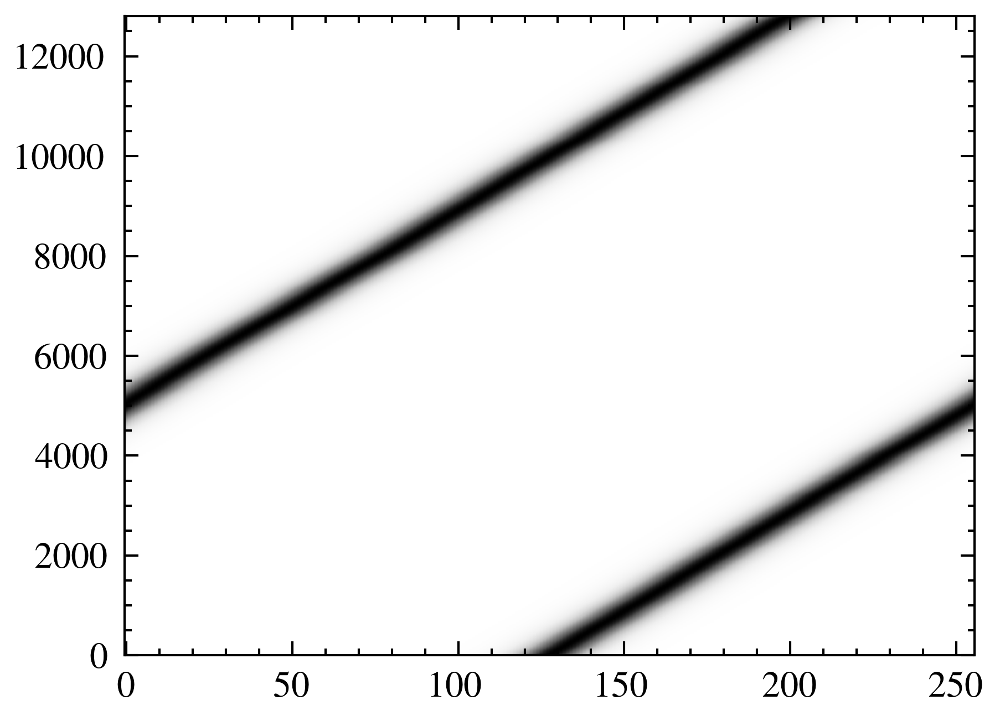

In [119]:
array_all = jnp.zeros([4,8])
for j in range(4):
    noise_magnitude_now = 1 * 2**(-j) # noise magnitude
    for i in range(8):
        signal_params = ConfigDict(KDV_params_exact_traveling)
        signal_params.update(E=1,method='Dealiased_SETDRK4',dt= 1e-3*1/2**i,tmax=0.1,nx=256,P=1,S=0,noise_magnitude=noise_magnitude_now,initial_condition='very_steep_traveling_wave')
        print(j,i)
        signal_model = ETD_KT_CM_JAX_Vectorised(signal_params)
        initial_signal = initial_condition(signal_model.x, signal_params.E, signal_params.initial_condition)
        dW =(dW_refine[i]/jnp.sqrt(2**(8-i))) #[:,0,0]# renormalise.
        final, all = signal_model.run(initial_signal, signal_model.nmax, dW) #the final input is scan length? 
        plt.imshow(all[:,0,:],aspect='auto',cmap='Grays',origin='lower')
        signal = jnp.concatenate([initial_signal[None,...], all], axis=0)# key

        W = jnp.cumsum(dW, axis=0)
        W = jnp.sqrt(signal_model.params.dt) * signal_model.params.noise_magnitude * W
        W_new = jnp.zeros([signal_model.nmax+1, signal_model.params.E, signal_model.params.P])
        W_new = W_new.at[1:,:,:].set(W)

        E = signal_model.params.E
        nmax = signal_model.nmax
        nx = signal_model.params.nx
        x = signal_model.x
        xmax = signal_model.params.xmax
        xmin = signal_model.params.xmin
        dt = signal_model.params.dt
        analytic = jnp.zeros([nmax+1, E, nx])

        initial_condition_jitted = jax.jit(initial_condition, static_argnums=(1,2))# jitted with last two arguments frozen
        def compute_ans(n, x, dt, W_new, xmax, E, initial_condition):
            return initial_condition_jitted((x - 9 * 9 * (dt * n) - W_new[n, :, :] + xmax) % (xmax * 2) - xmax, E, signal_params.initial_condition)
        compute_ans_vmap = vmap(compute_ans, in_axes=(0, None, None, None, None, None, None))
        # Generate the range of n values
        n_values = jnp.arange(signal_model.nmax + 1)
        # Compute analytic using the vectorized function
        analytic = compute_ans_vmap(n_values, x, dt, W_new, xmax, E, signal_params.initial_condition)


        def relative_error(signal, analytic):
            return jnp.linalg.norm(signal-analytic)/jnp.linalg.norm(analytic)

        array_all = array_all.at[j,i].set( relative_error(signal[:,:,:], analytic[:,:,:]) )
plt.show()

[8.89309620e-01 4.87053293e-01 5.08239363e-02 2.54293868e-03
 9.77488464e-05 3.95171411e-06 1.88303739e-07 1.07870161e-08] (8,)


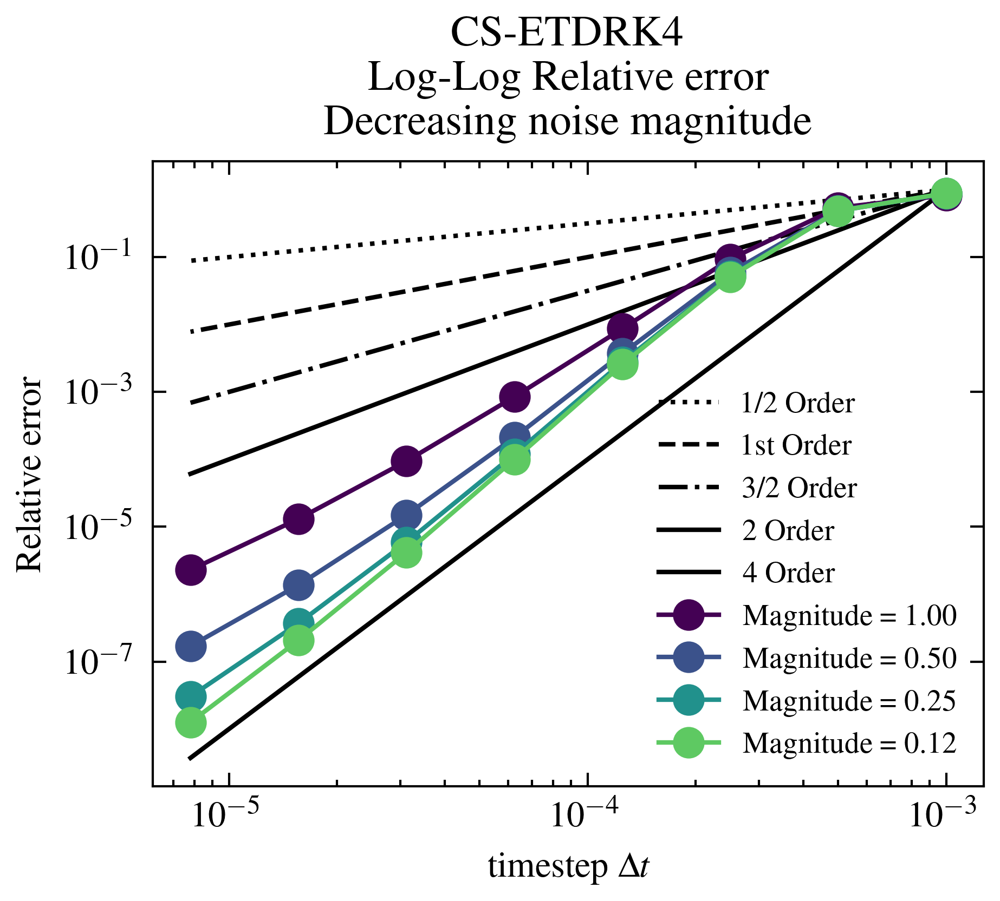

In [126]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
from matplotlib import rc
plt.style.use(['science','ieee'])
rc('text', usetex=True)
dt = 1e-3*np.asarray([1.,1/2,1/4,1/8,1/16,1/32,1/64,1/128])
values = array
print(values,values.shape)
a = 1e-3# dtmin
v=1# vertical skaling factor for the plot
plt.figure()

plt.loglog(dt,(dt**0.5)/a**0.5*v, linestyle=':', color='k', label=r'1/2 Order')
plt.loglog(dt,dt/a*v, linestyle='--', color='k', label='1st Order')
plt.loglog(dt,(dt**1.5)/a**1.5*v, linestyle='-.', color='k', label='3/2 Order')
plt.loglog(dt,dt**2/a**2*v, linestyle='-', color='k', label='2 Order')
plt.loglog(dt,dt**4/a**4*v, linestyle='-', color='k', label='4 Order')
for j in range(4):
    plt.loglog(dt,array_all[j,:], marker='o', linestyle='-', color=plt.cm.viridis(j / 4),label=f'Magnitude = { 2**(-j):.2f}')

plt.xlabel(r'timestep $\Delta t$')
plt.ylabel('Relative error')
plt.title('CS-ETDRK4\n Log-Log Relative error \n Decreasing noise magnitude')
#plt.grid(True, which="both", ls="--")
plt.legend(fontsize='small')
plt.savefig('/Users/jmw/Documents/GitHub/Particle_Filter/Saving/Temporal_convergence_2_small_noise.png',bbox_inches='tight',dpi=300)
plt.show()

We shall now compare to the IFSKR4 method

i=5
nmax = int(1e4 * 2**i) #10000 same
print(int(1e4),nmax)
tmax = 0.1 # same
dt = 1e-5*(1/2)**i  works

Parameters: $\Delta t = 1e-4 1/2^{i}$ $i\in \lbrace 1,...,10 \rbrace$, $t_{max}=0.1$, $n_{x}=256$, $\xi = 1$, $u_0 = 3 \beta \cosh( 0.5\sqrt{\beta} ( x ) )^{-2}$ where $\beta = 8^2$.

In [132]:
key1 = jax.random.PRNGKey(0)
i=12# maximum resolution refinement level
nmin = int(1e2) # minimum number of timesteps 10000
nmax = int(1e2 * 2**i) # maximum number of timesteps
tmax = 0.1 # 0.1 timestep
dt = tmax/nmax # tmax/nmax 
E=1; P=1; # number of particles and number of basis of noise.

dW = jax.random.normal(key1, shape=(nmax, E, P)) # maximumly refined Wiener increments
dW_refine = []; W_refine = []; time_refine = [] # arrays to store the created Wiener increments and their cumulative sums

for l in range(0, i+1):
    nmax = int(1e2 * 2**(l))# the initial one is at lowest resolution 
    time_refine.append( jnp.linspace(0, tmax, nmax) )
    dW_refine.append(dW)
    W_refine.append(jnp.cumsum(dW, axis=0))
    dW = (dW + jnp.roll(dW, -1, axis=0))[::2, :, :]
dW_refine.reverse()
W_refine.reverse()
print(len(time_refine[0]),len(W_refine[0]),len(dW_refine[0]))
print(len(time_refine[-1]),len(W_refine[-1]),len(dW_refine[-1]))

100 100 100
409600 409600 409600


100


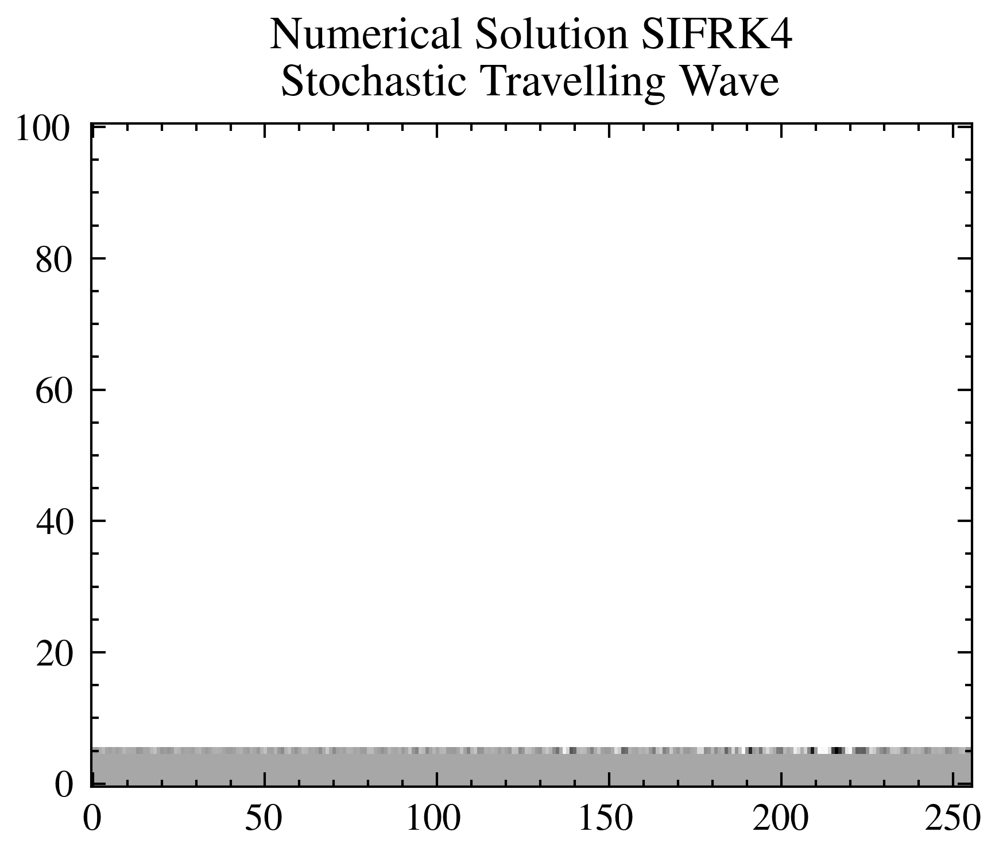

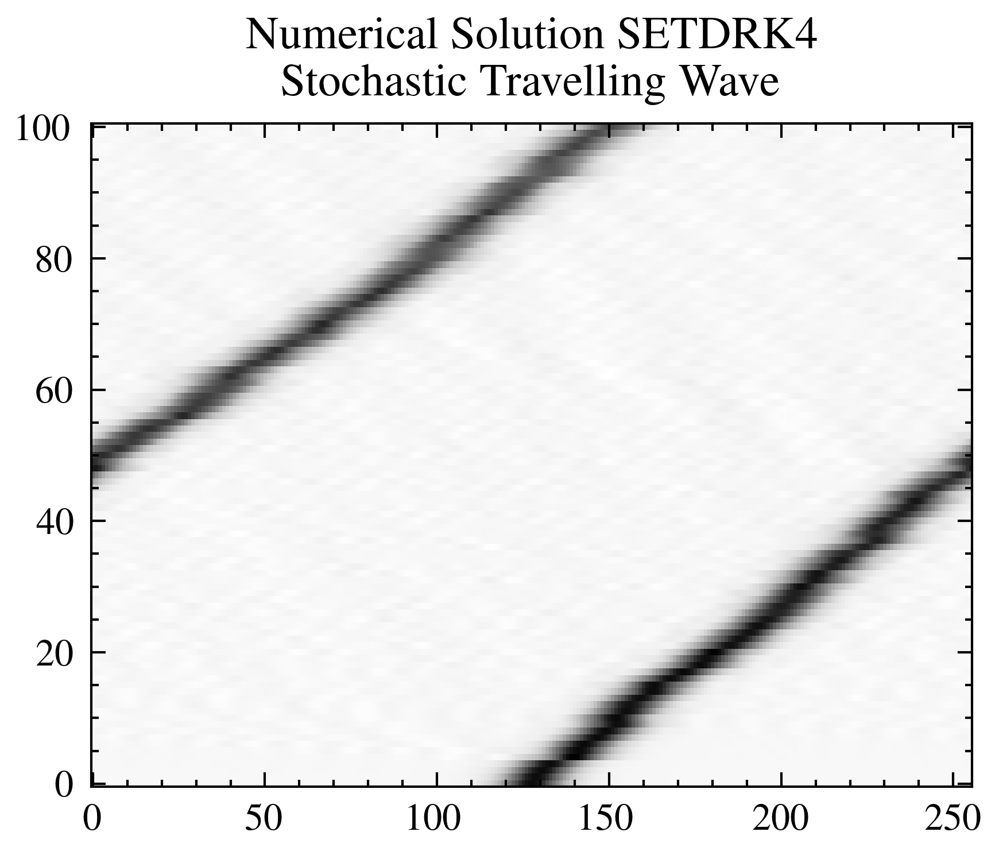

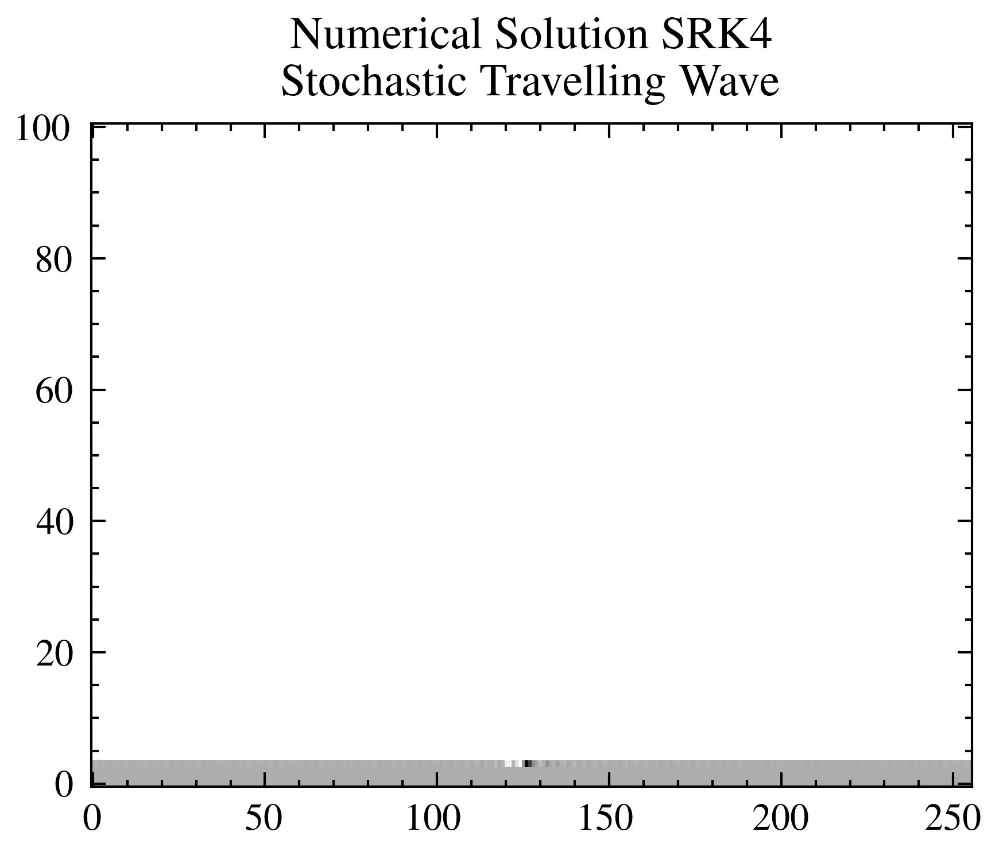

dt: 0.001 nt 100 Tmax 0.1
array: [nan  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.] [0.73892906 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.        ] [nan  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


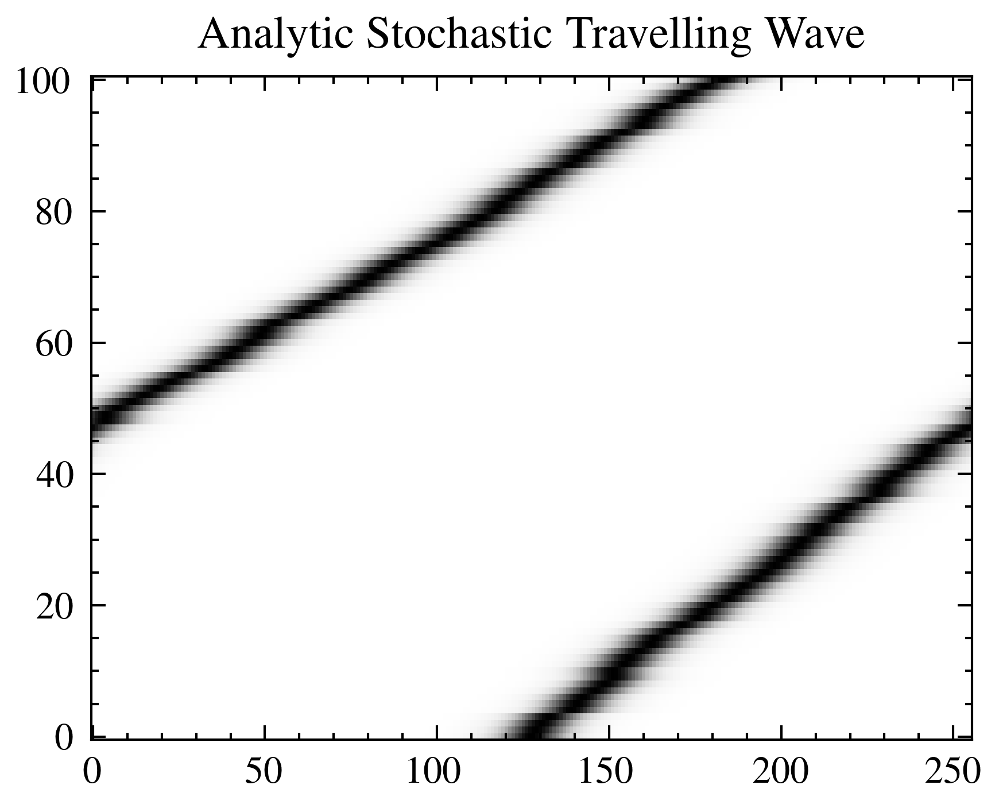

200


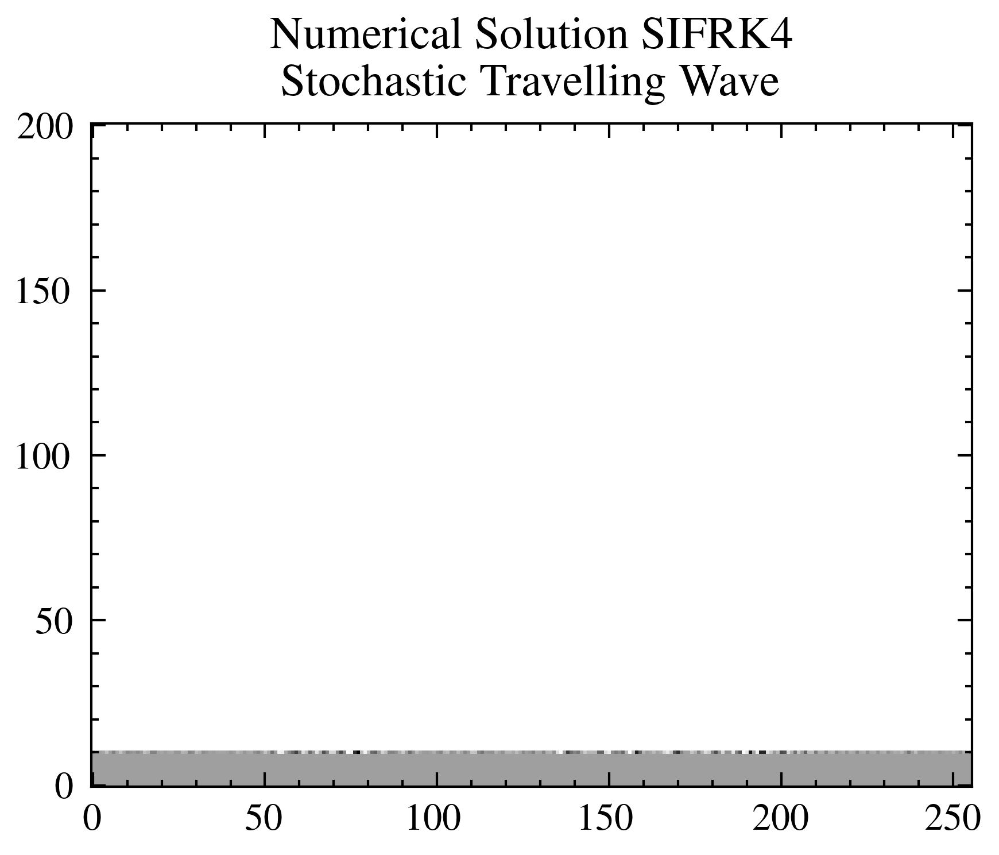

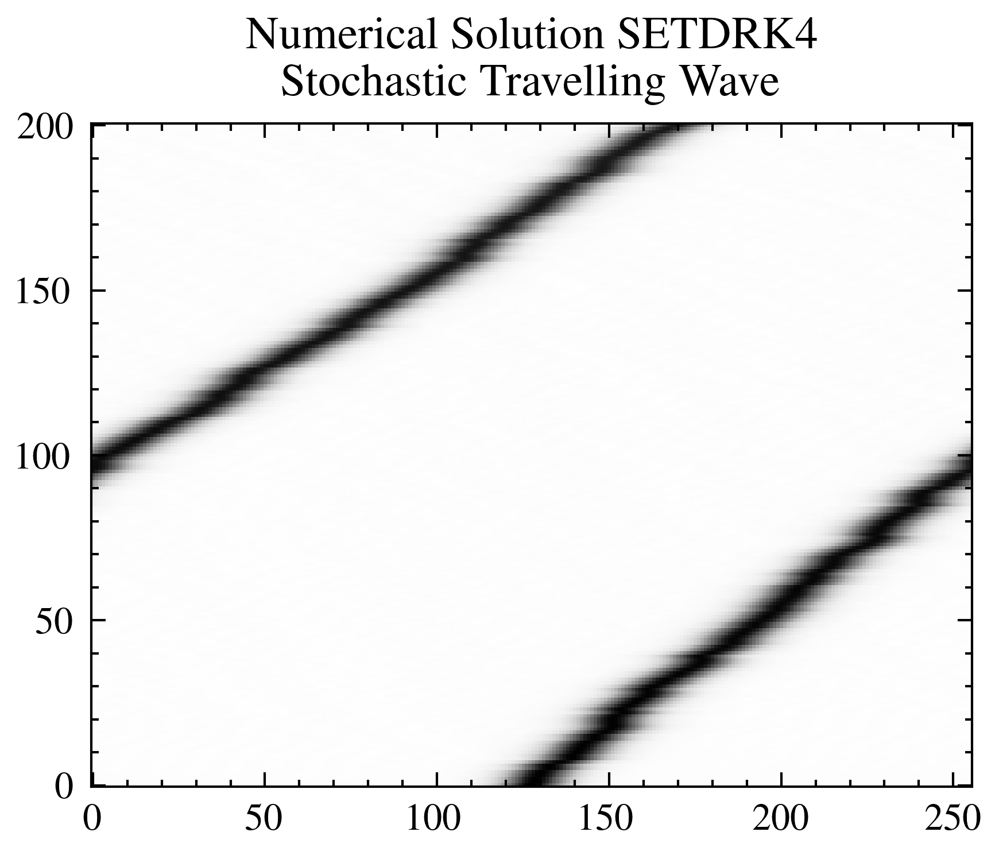

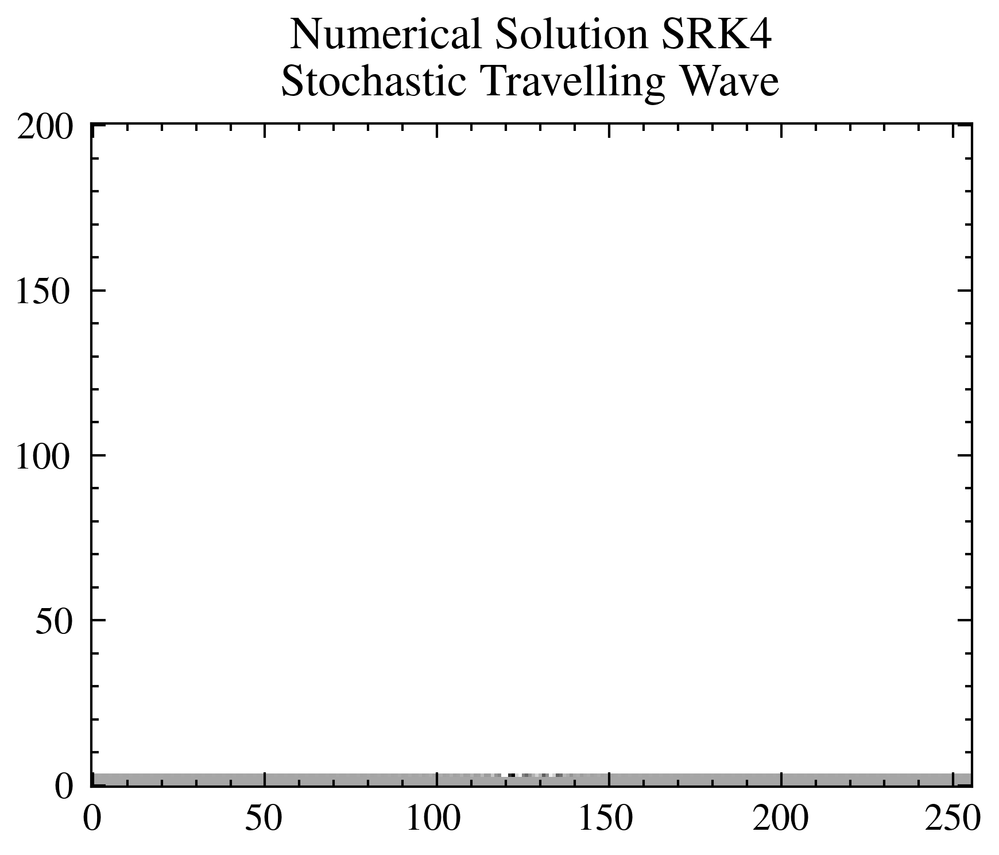

dt: 0.0005 nt 200 Tmax 0.1
array: [nan nan  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.] [0.73892906 0.50638244 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.        ] [nan nan  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]


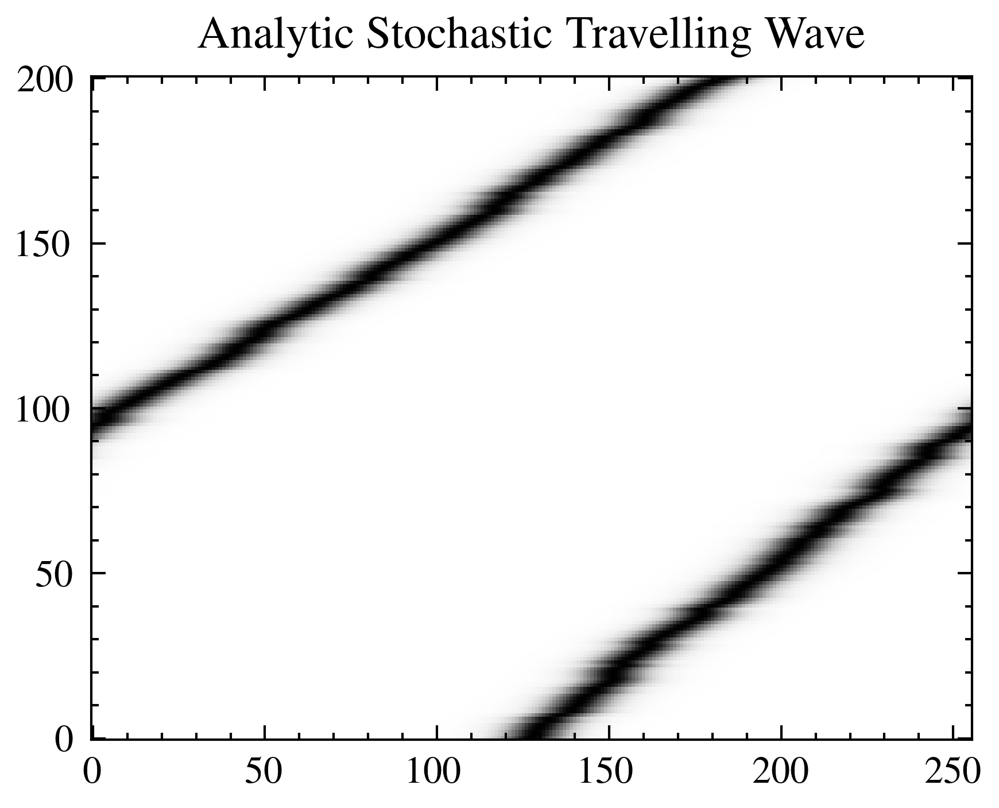

400


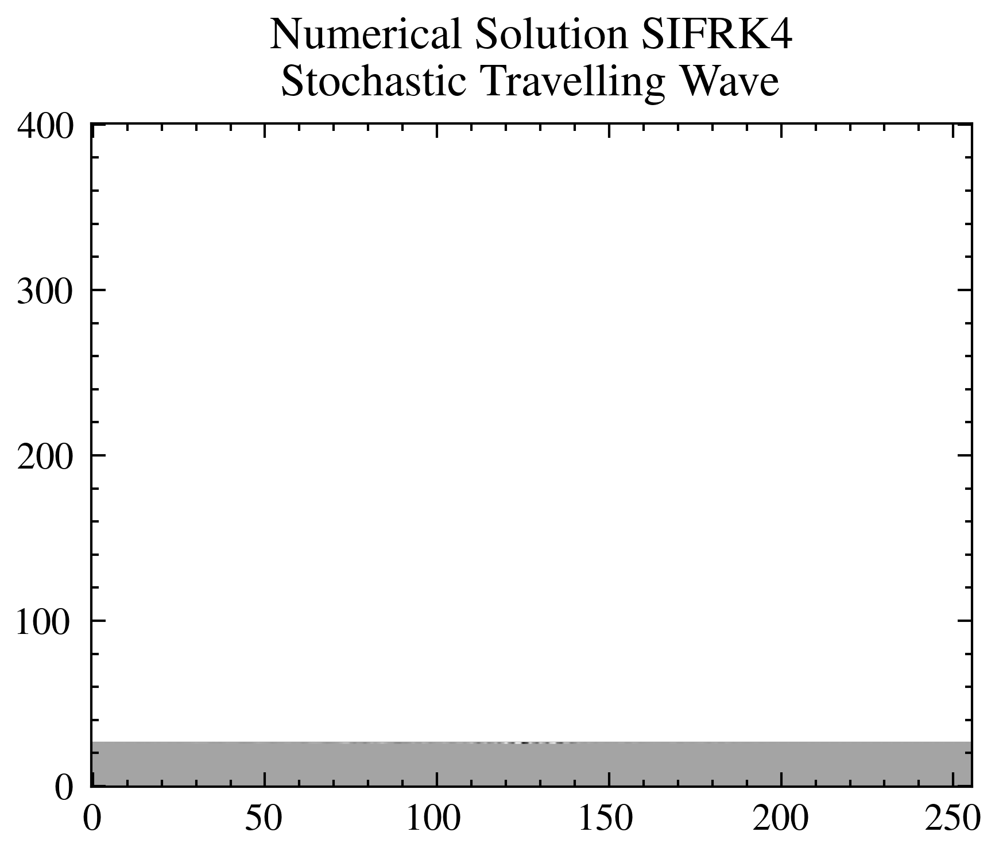

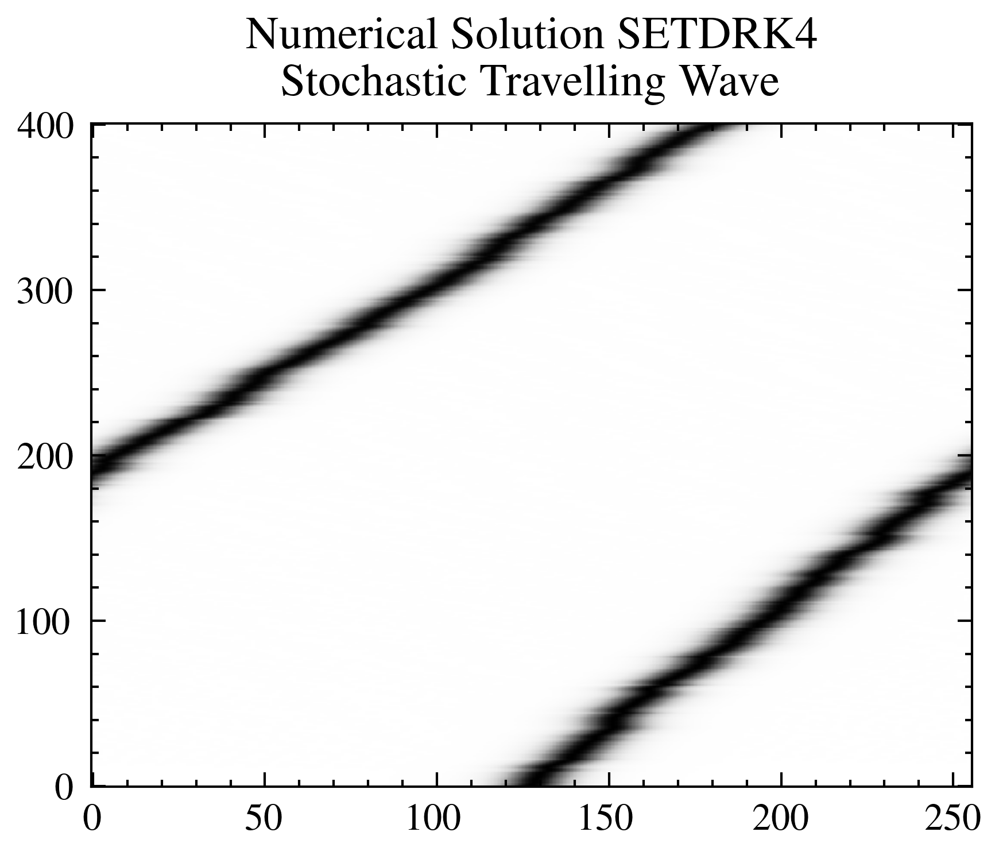

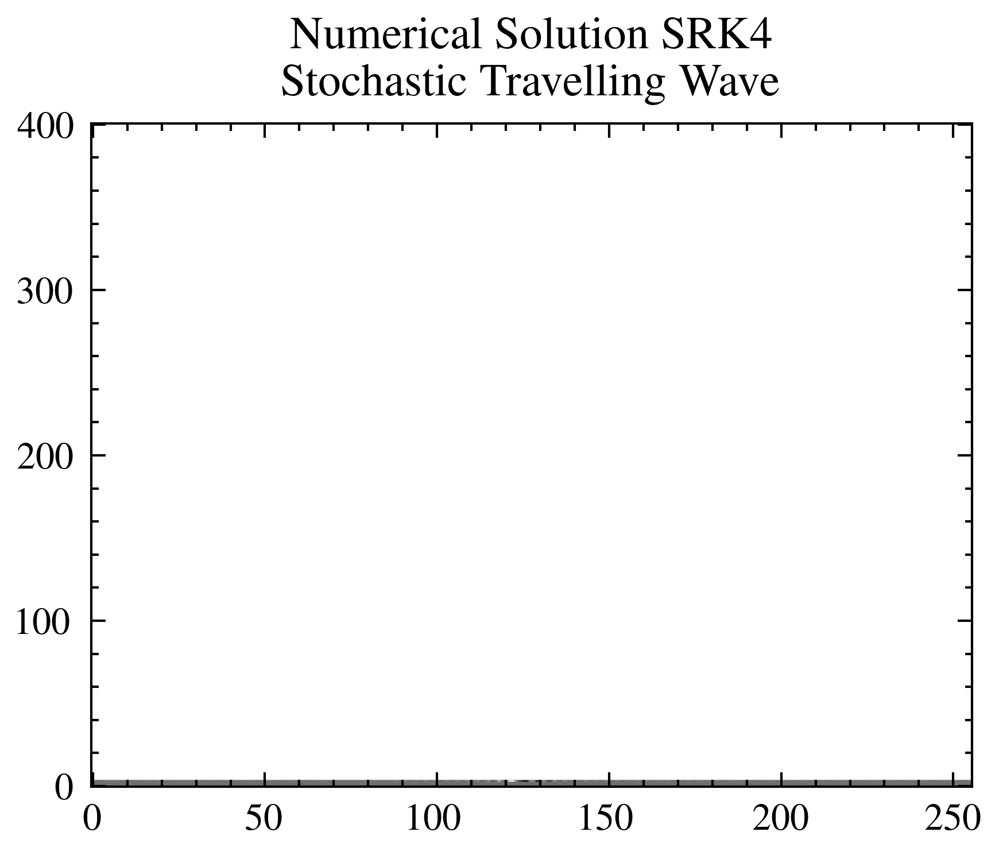

dt: 0.00025 nt 400 Tmax 0.1
array: [nan nan nan  0.  0.  0.  0.  0.  0.  0.  0.  0.] [0.73892906 0.50638244 0.09938325 0.         0.         0.
 0.         0.         0.         0.         0.         0.        ] [nan nan nan  0.  0.  0.  0.  0.  0.  0.  0.  0.]


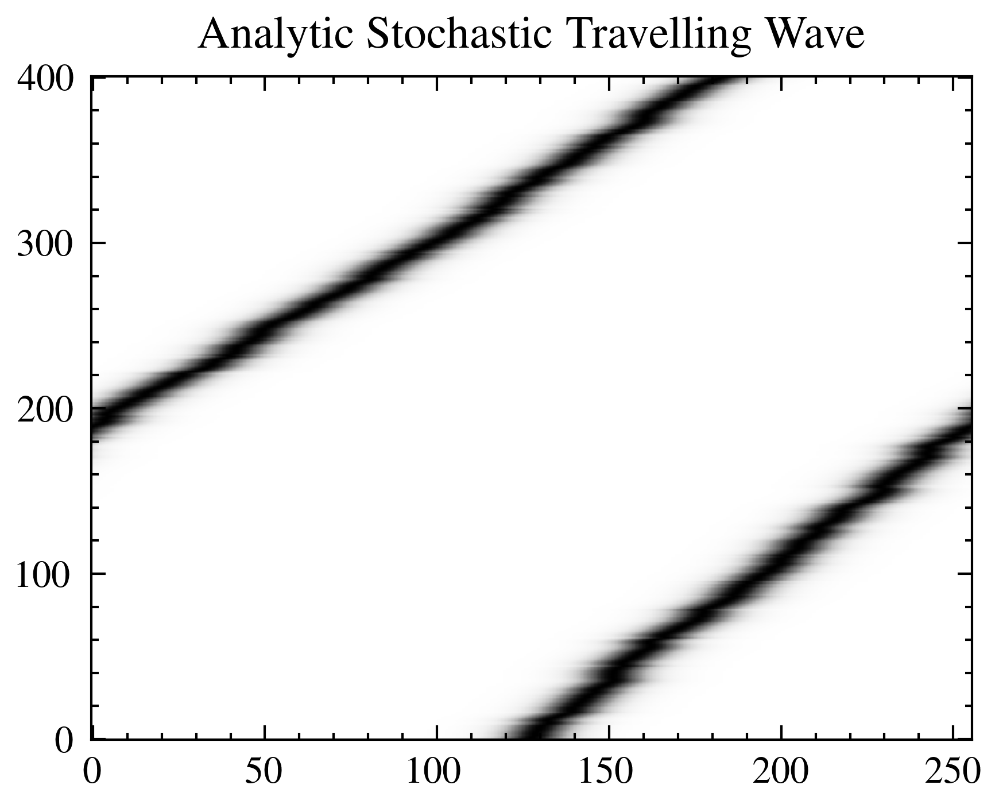

800


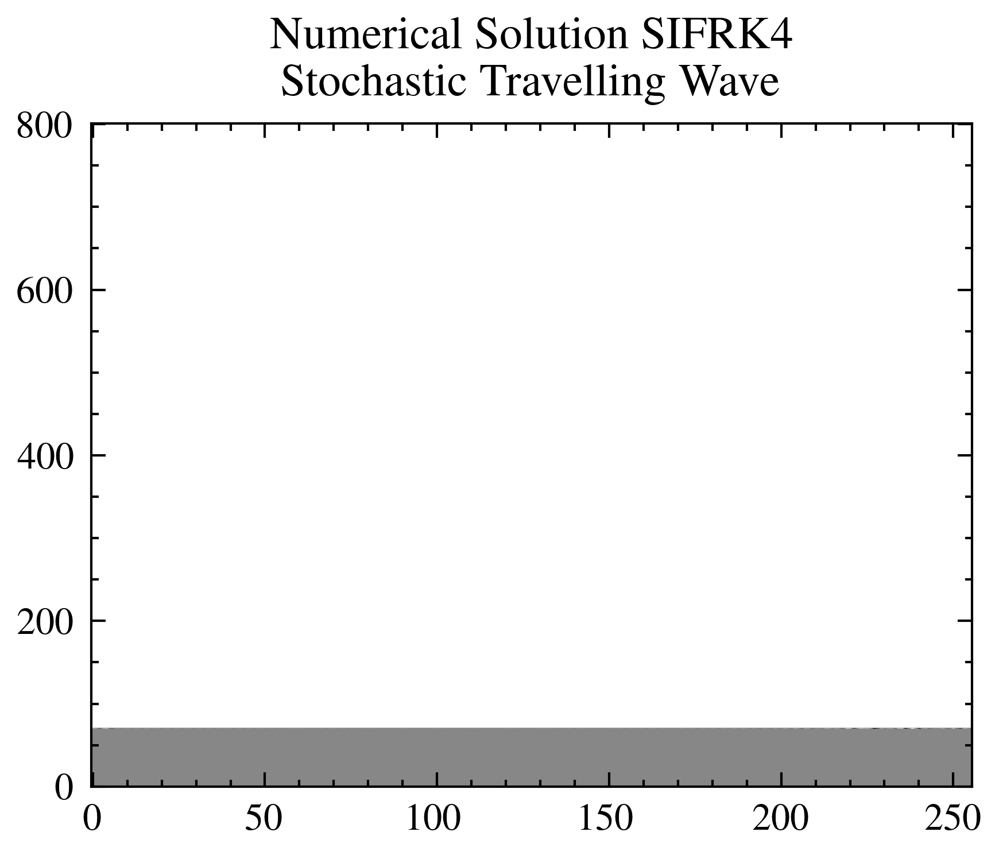

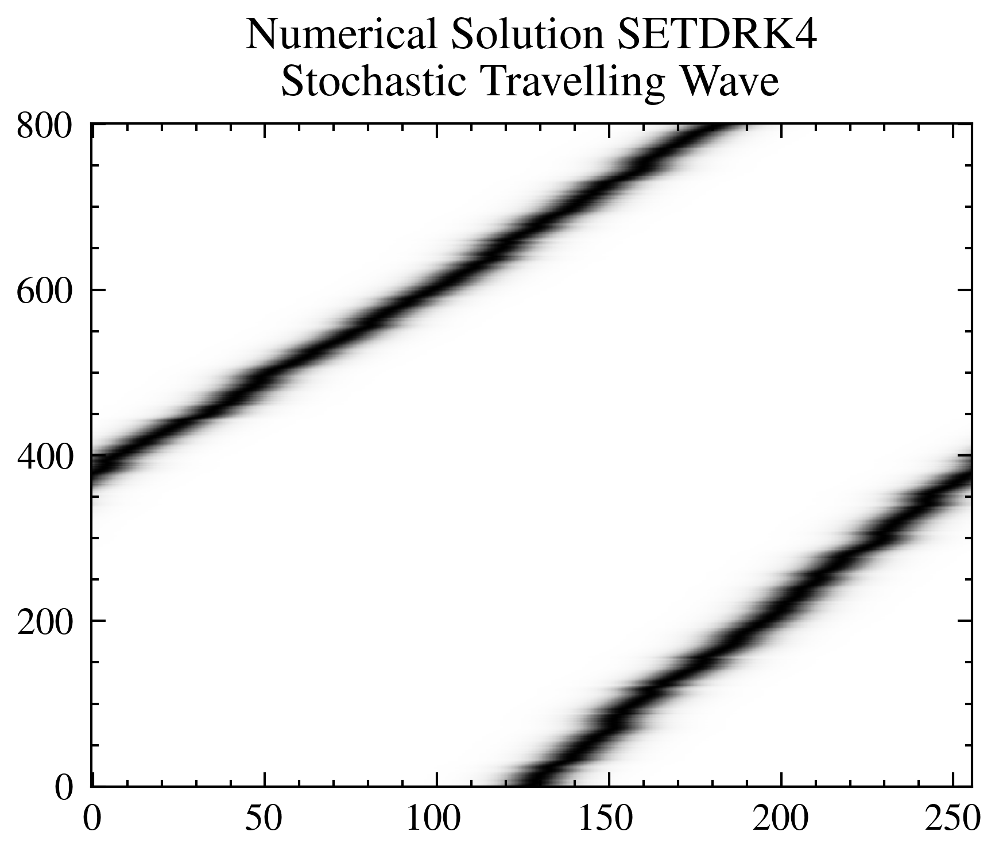

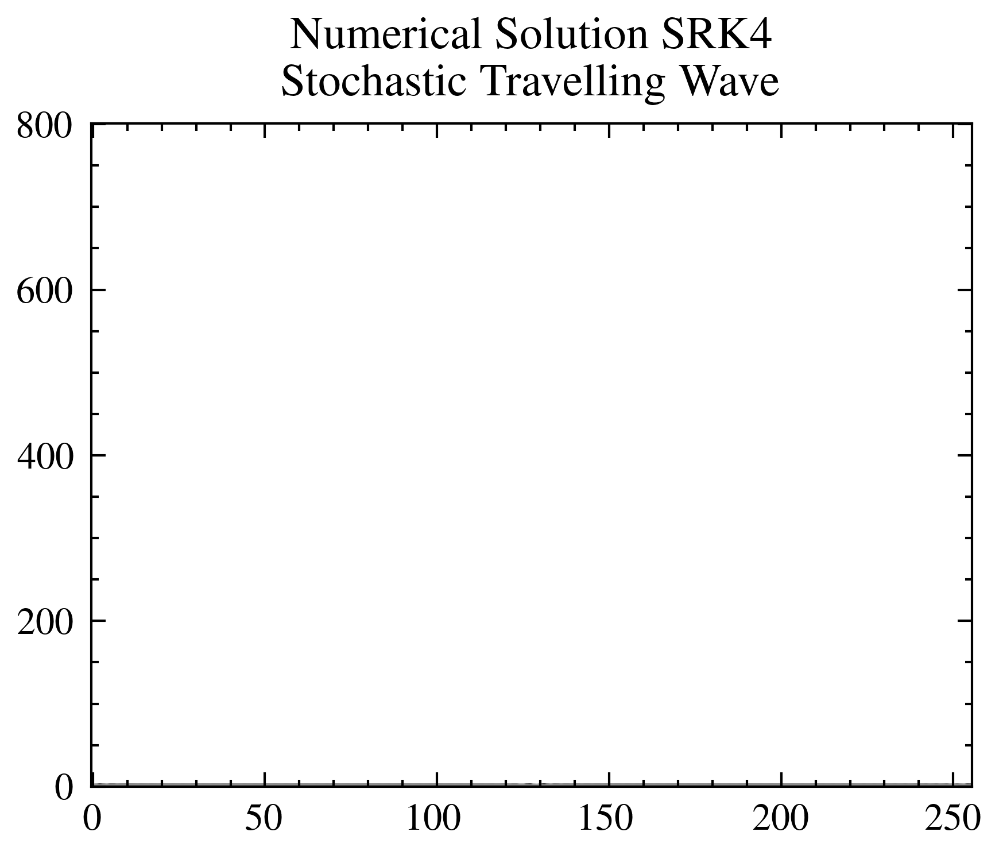

dt: 0.000125 nt 800 Tmax 0.1
array: [nan nan nan nan  0.  0.  0.  0.  0.  0.  0.  0.] [0.73892906 0.50638244 0.09938325 0.00858759 0.         0.
 0.         0.         0.         0.         0.         0.        ] [nan nan nan nan  0.  0.  0.  0.  0.  0.  0.  0.]


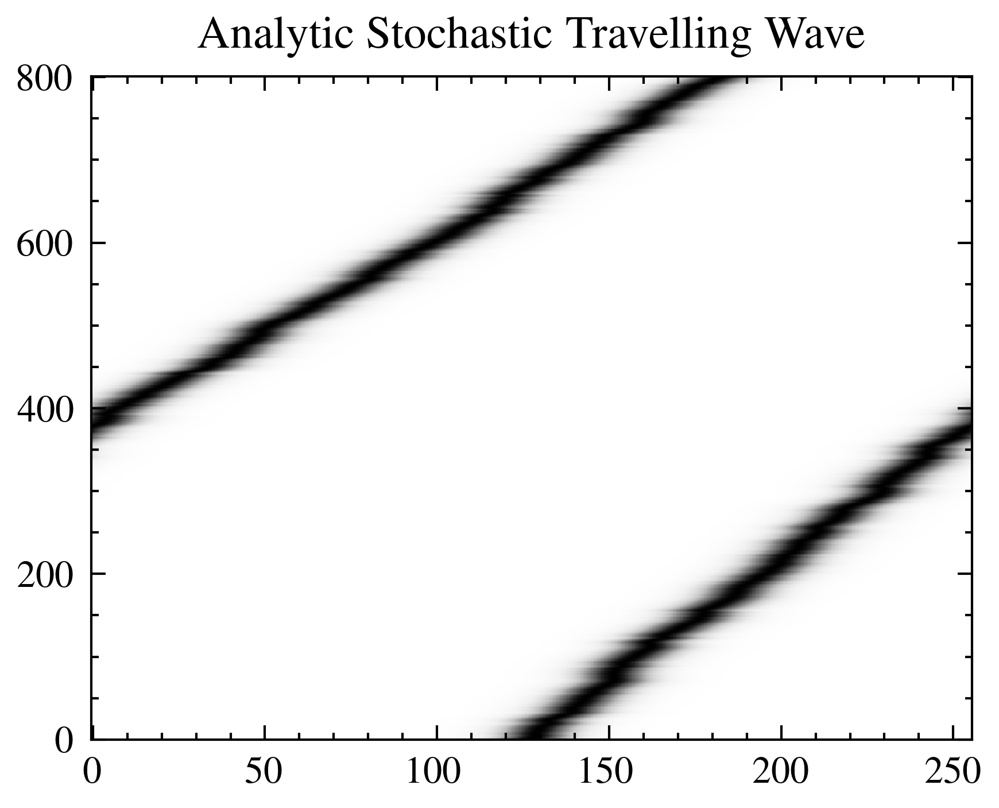

1600


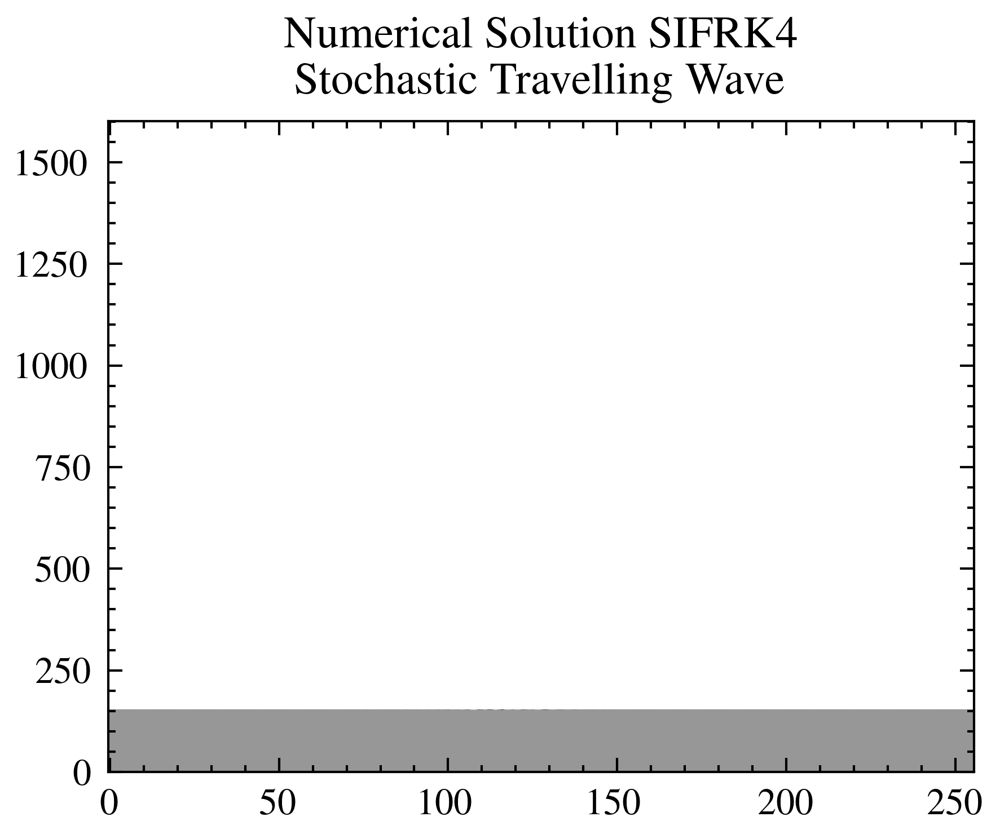

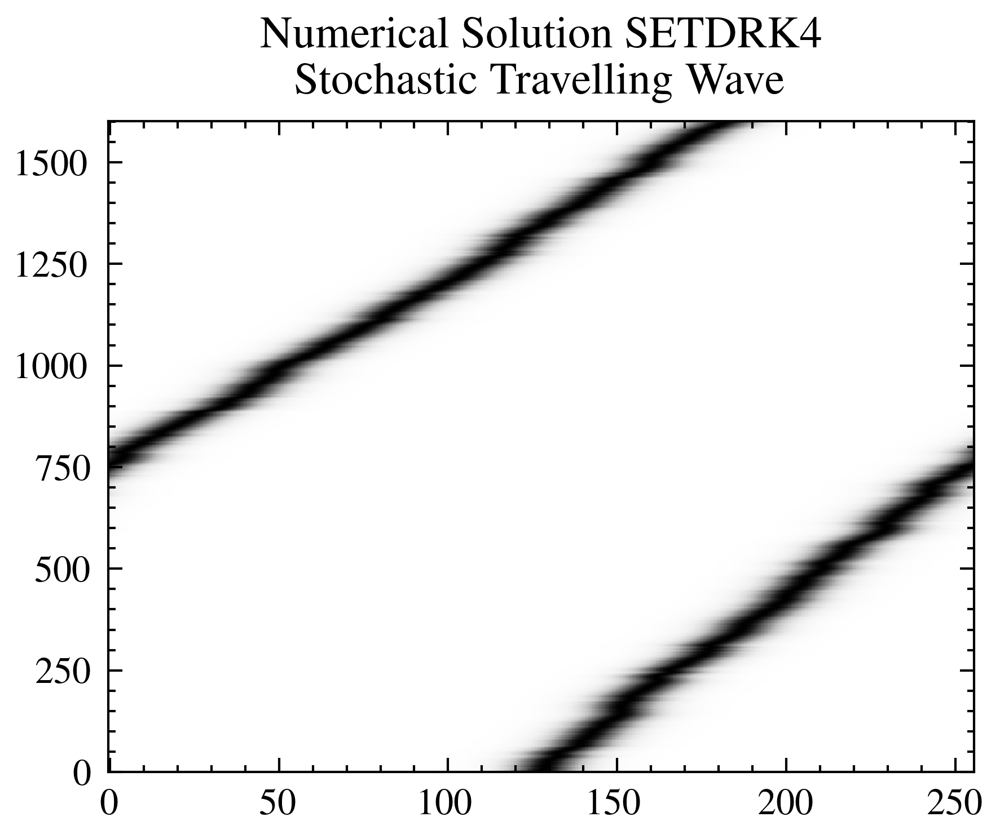

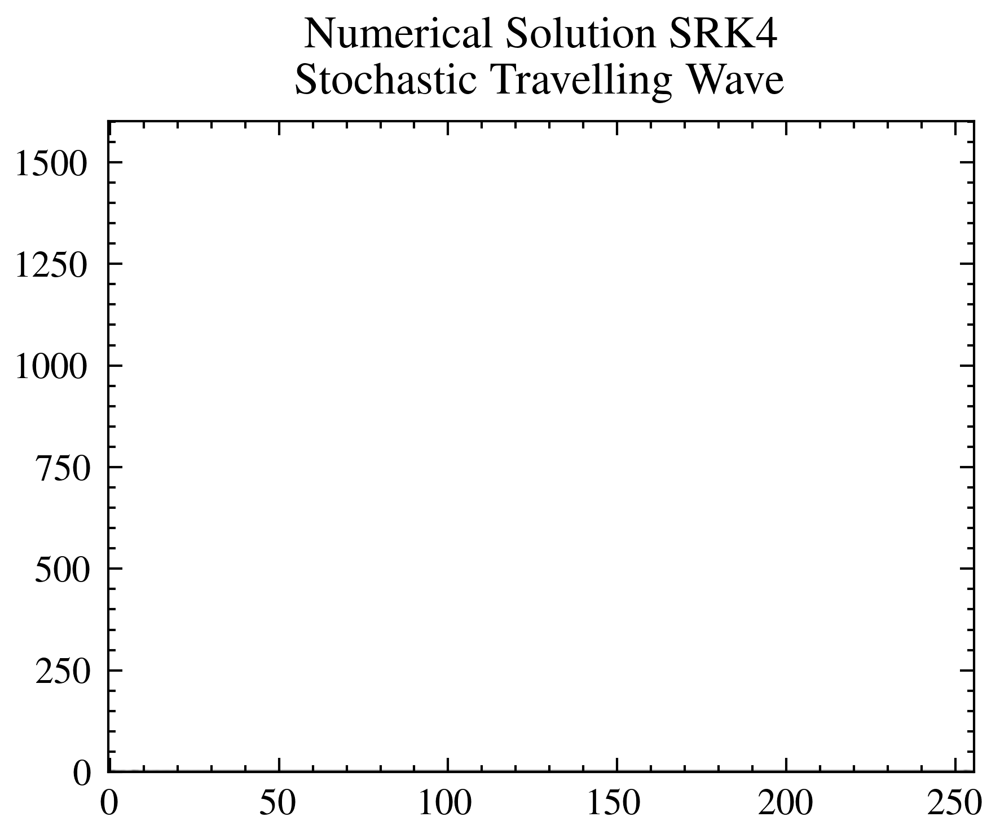

dt: 6.25e-05 nt 1600 Tmax 0.1
array: [nan nan nan nan nan  0.  0.  0.  0.  0.  0.  0.] [0.73892906 0.50638244 0.09938325 0.00858759 0.00076209 0.
 0.         0.         0.         0.         0.         0.        ] [nan nan nan nan nan  0.  0.  0.  0.  0.  0.  0.]


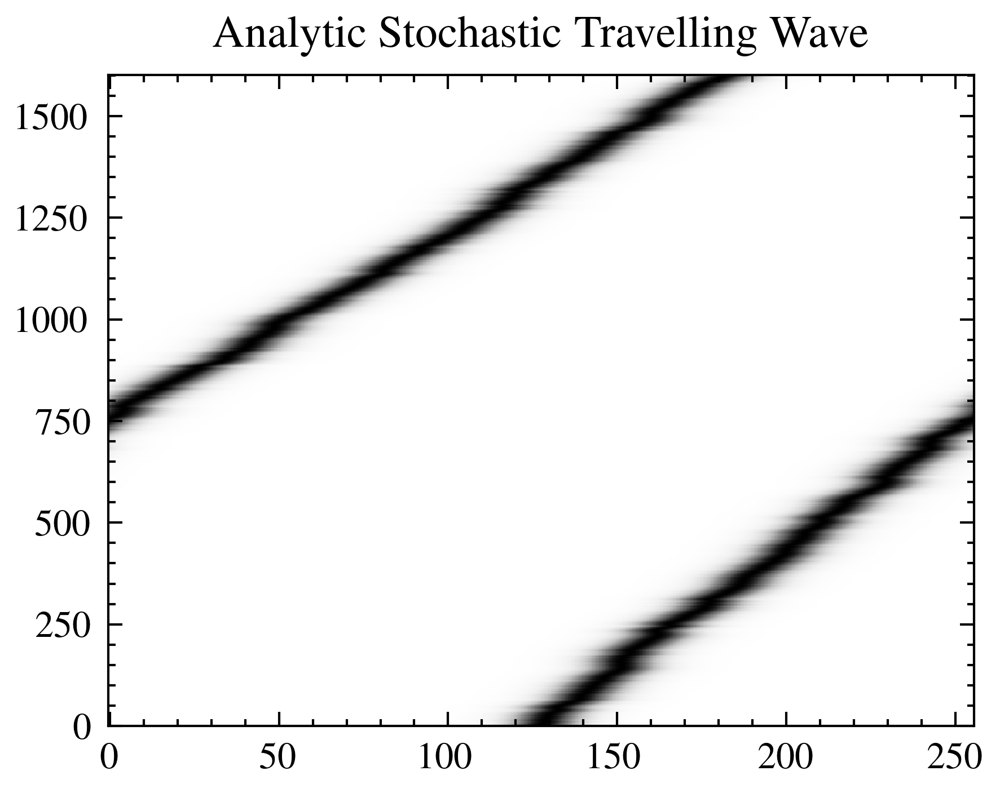

3200


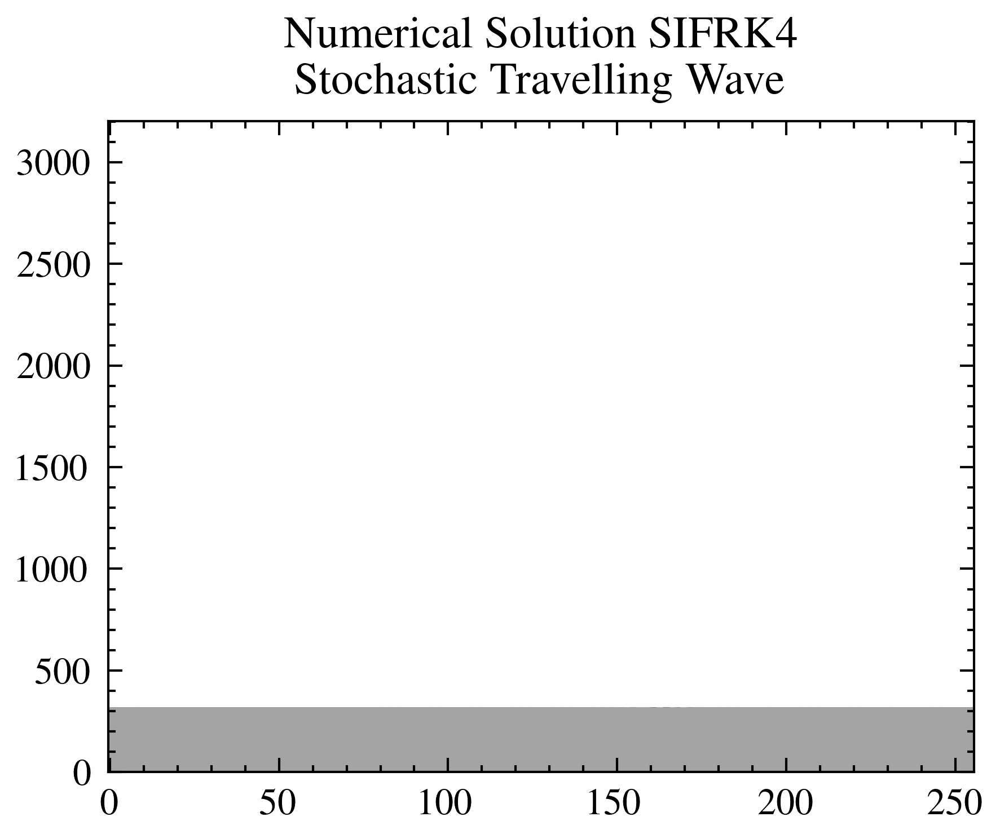

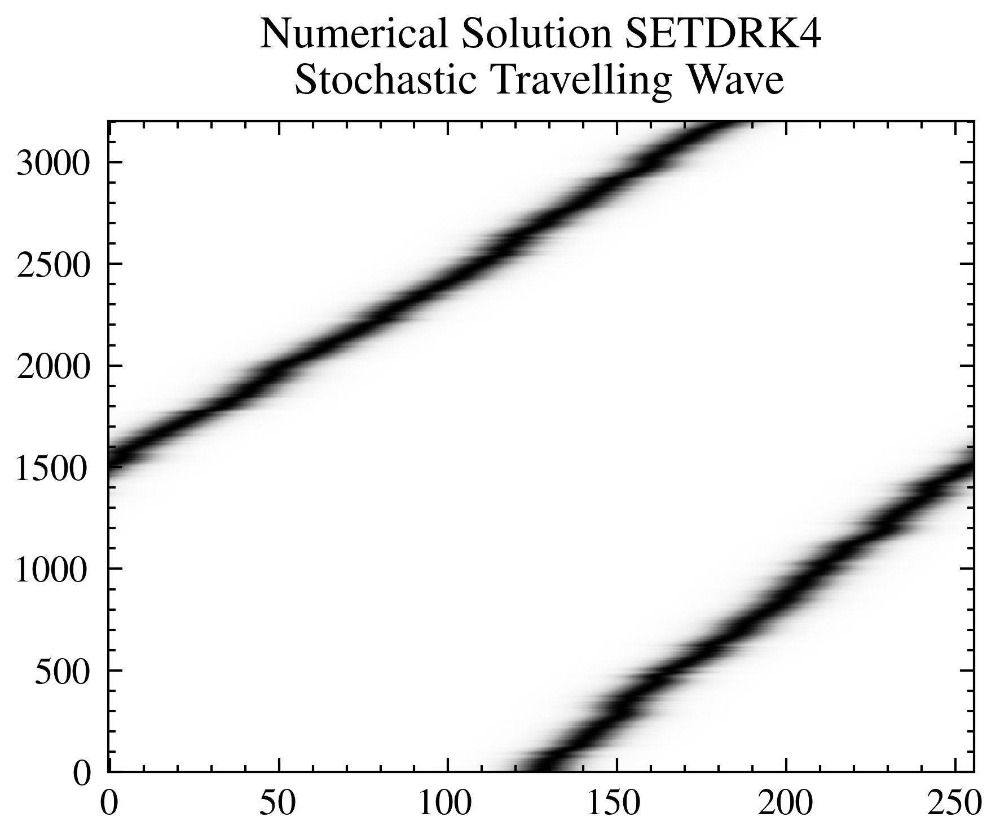

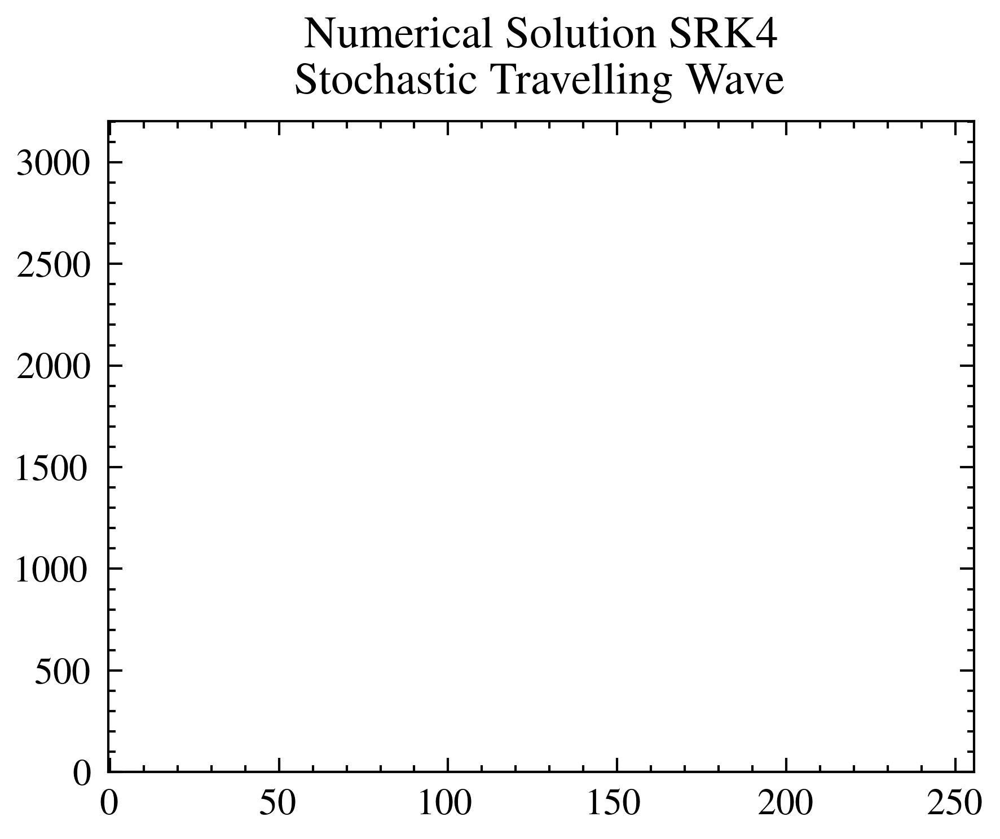

dt: 3.125e-05 nt 3200 Tmax 0.1
array: [nan nan nan nan nan nan  0.  0.  0.  0.  0.  0.] [7.38929063e-01 5.06382435e-01 9.93832494e-02 8.58759040e-03
 7.62090723e-04 8.80267685e-05 0.00000000e+00 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00] [nan nan nan nan nan nan  0.  0.  0.  0.  0.  0.]


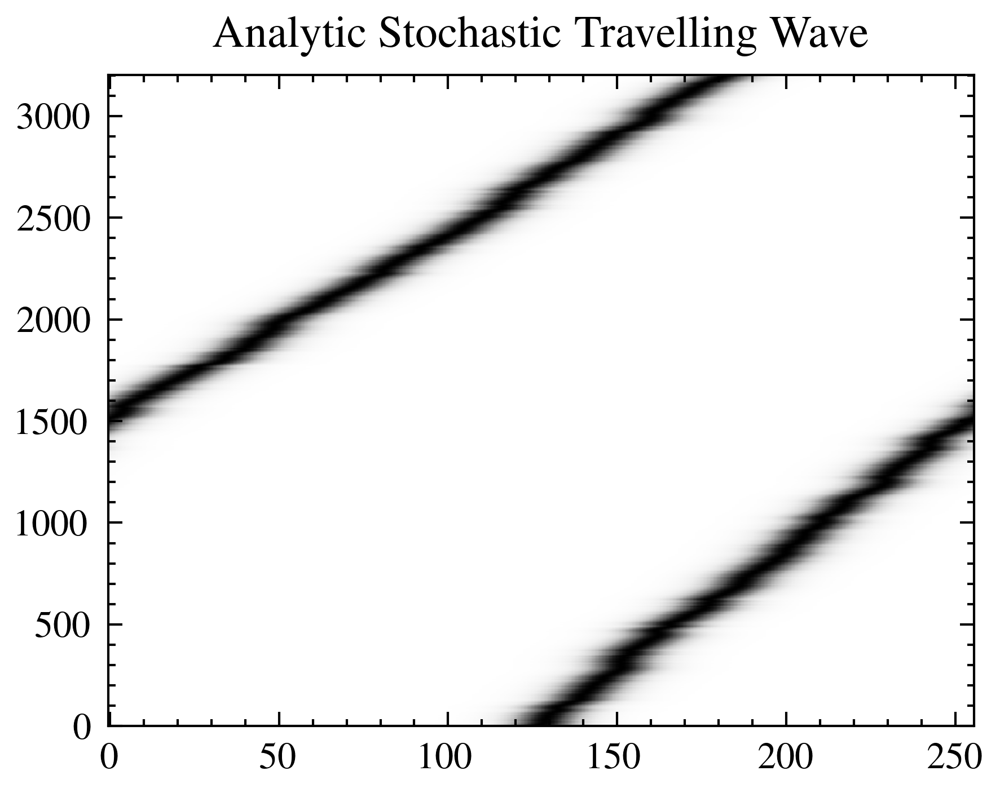

6400


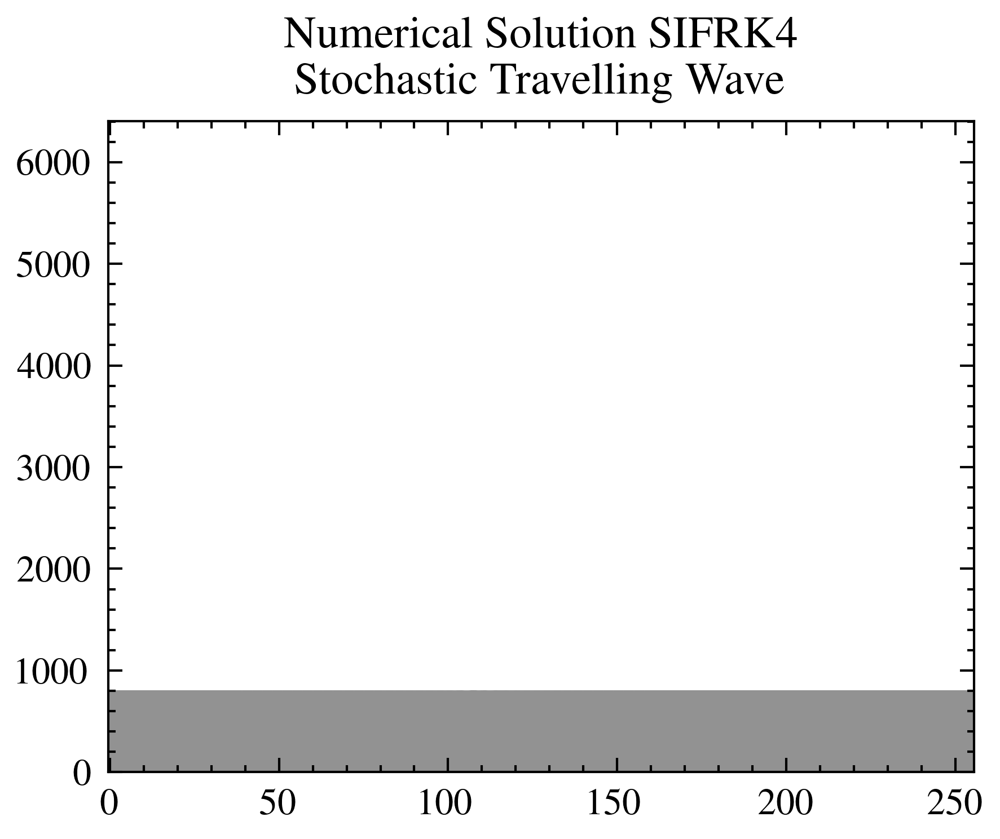

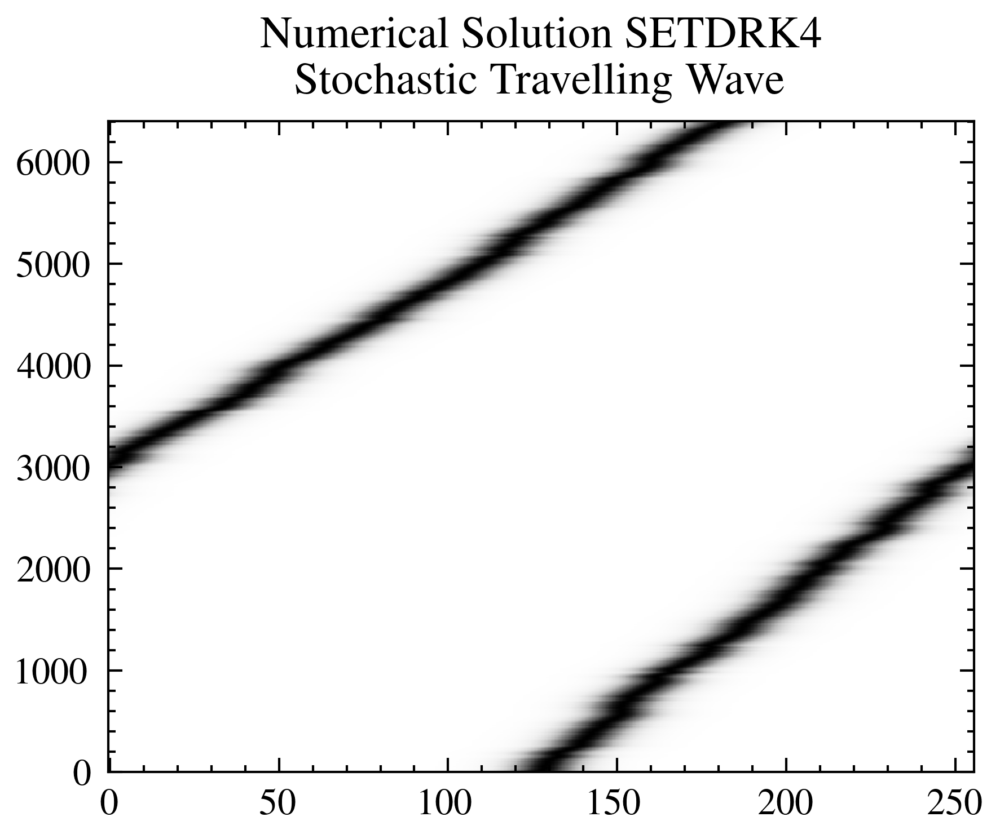

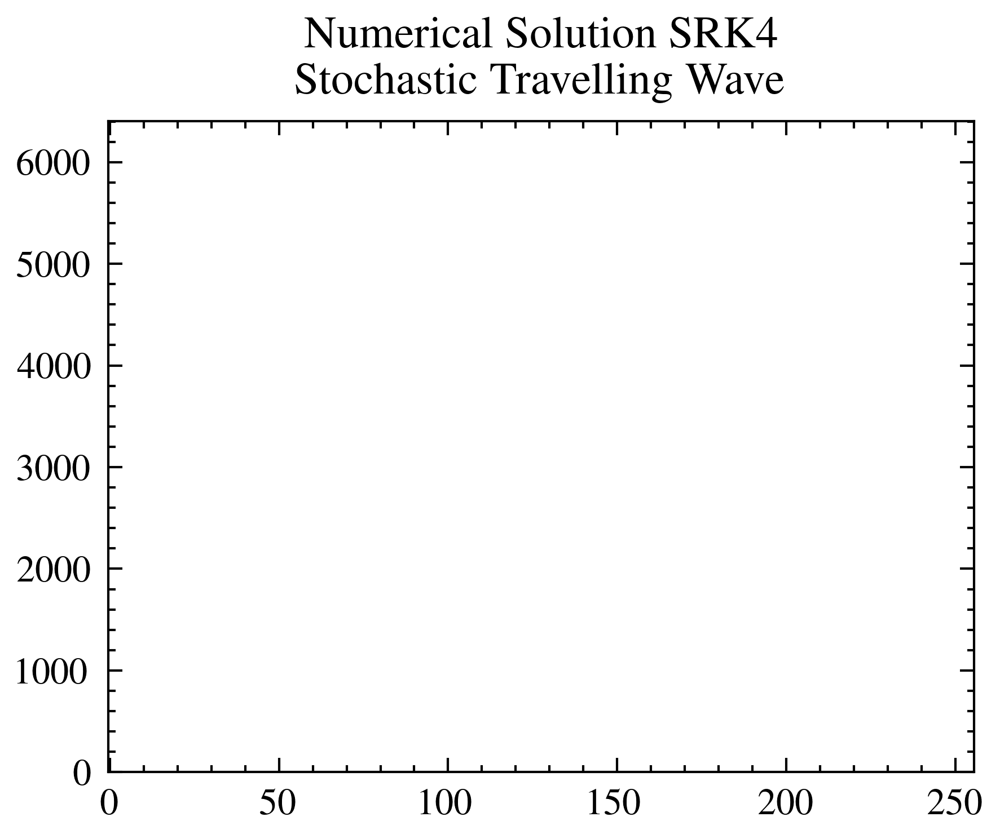

dt: 1.5625e-05 nt 6400 Tmax 0.1
array: [nan nan nan nan nan nan nan  0.  0.  0.  0.  0.] [7.38929063e-01 5.06382435e-01 9.93832494e-02 8.58759040e-03
 7.62090723e-04 8.80267685e-05 1.24289584e-05 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00] [nan nan nan nan nan nan nan  0.  0.  0.  0.  0.]


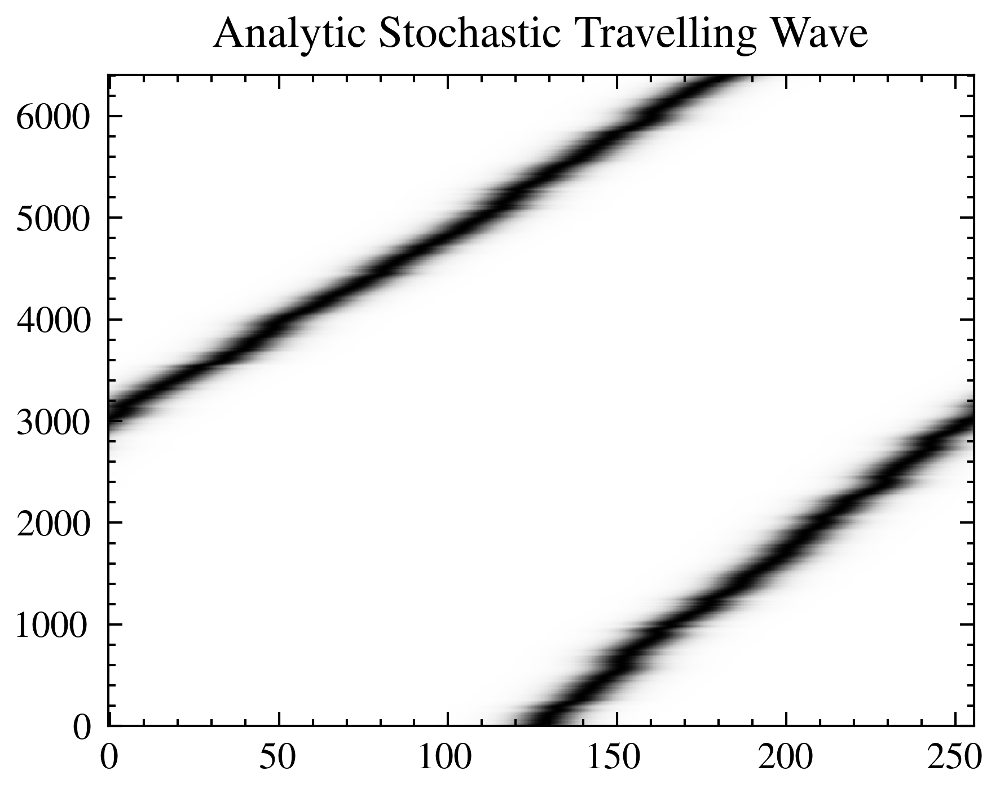

12800


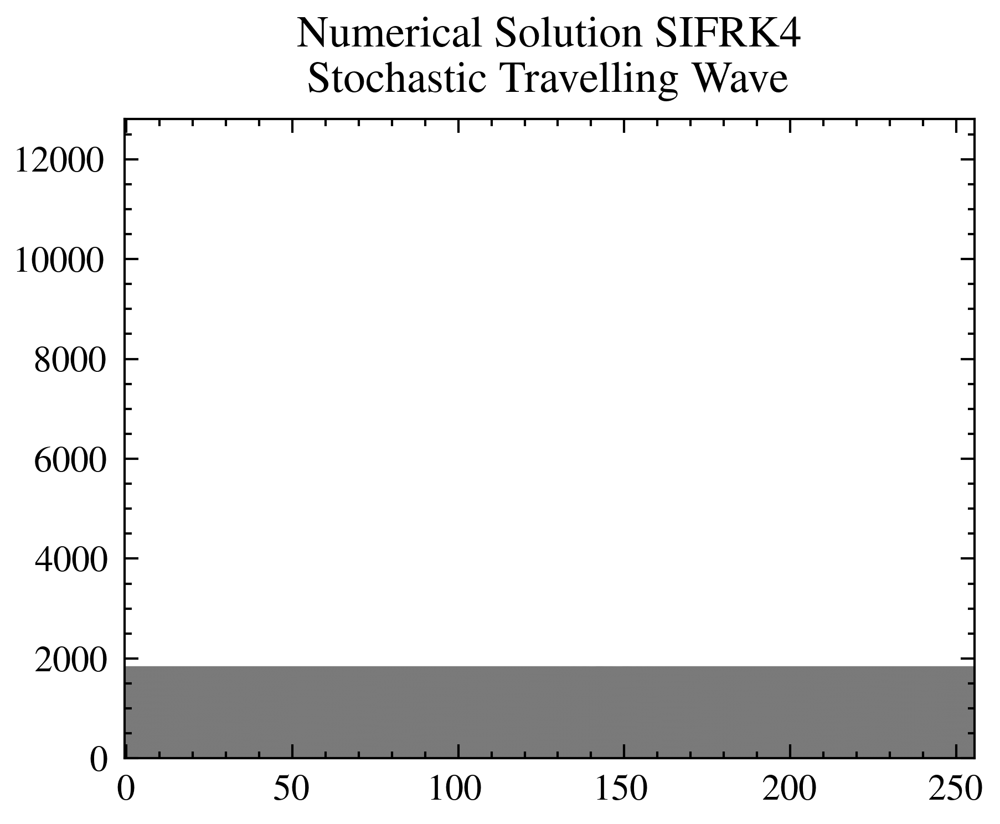

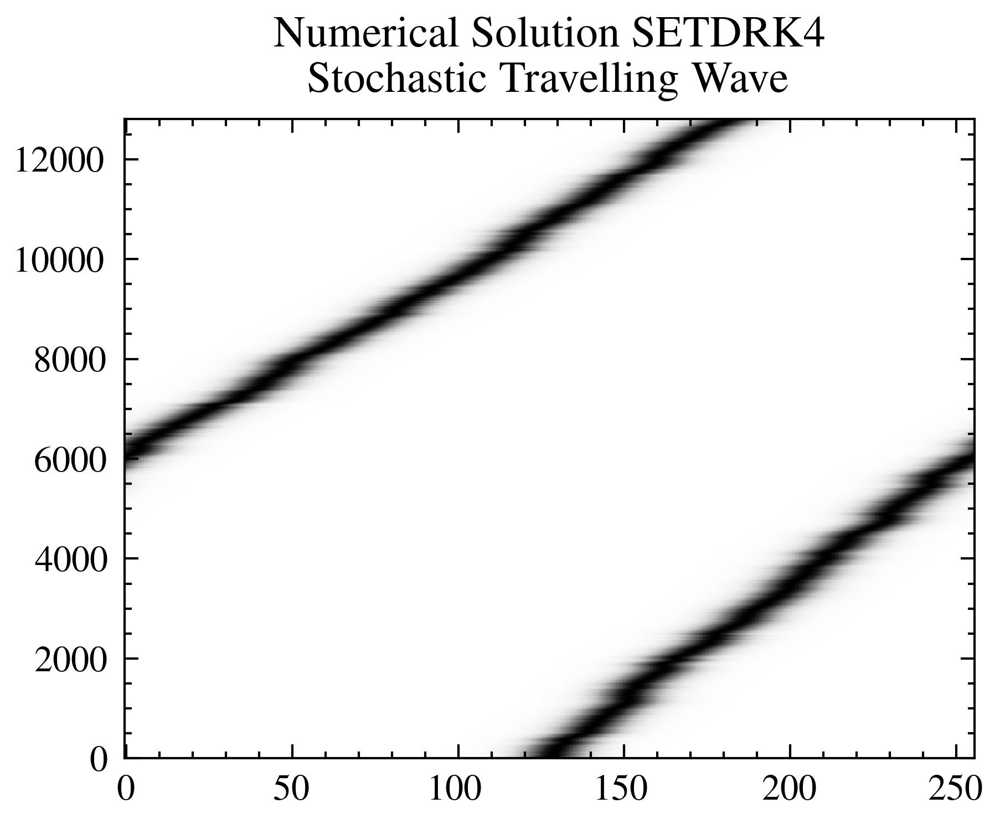

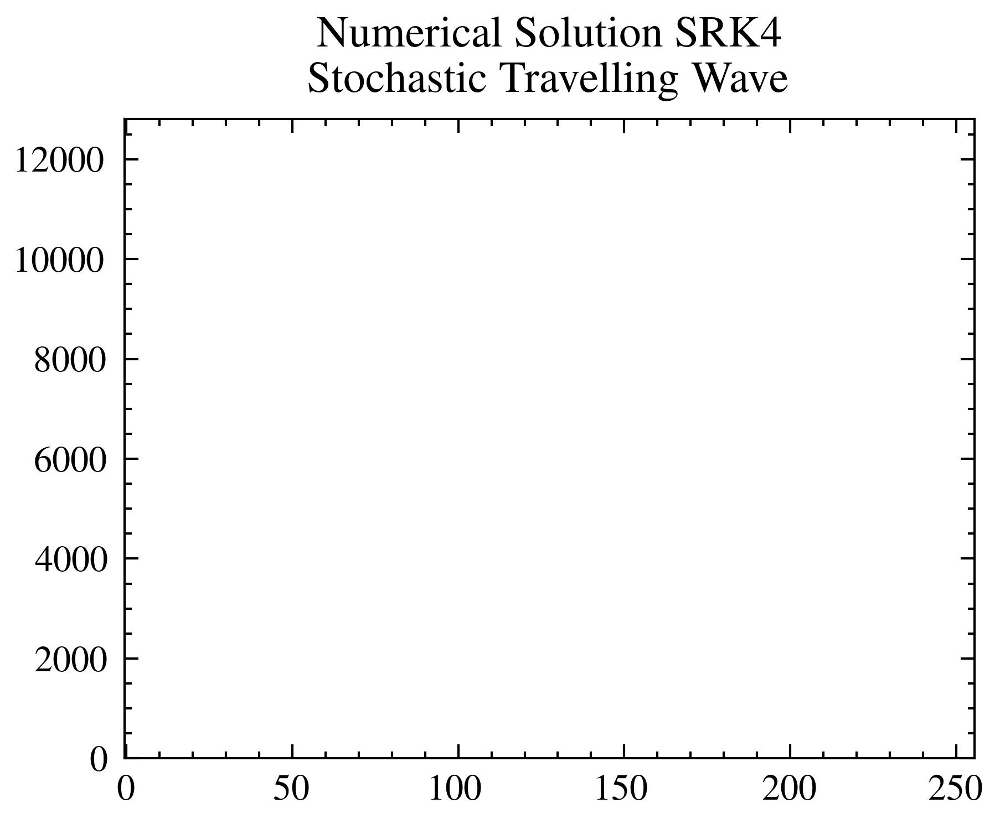

dt: 7.8125e-06 nt 12800 Tmax 0.1
array: [nan nan nan nan nan nan nan nan  0.  0.  0.  0.] [7.38929063e-01 5.06382435e-01 9.93832494e-02 8.58759040e-03
 7.62090723e-04 8.80267685e-05 1.24289584e-05 2.26390147e-06
 0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00] [nan nan nan nan nan nan nan nan  0.  0.  0.  0.]


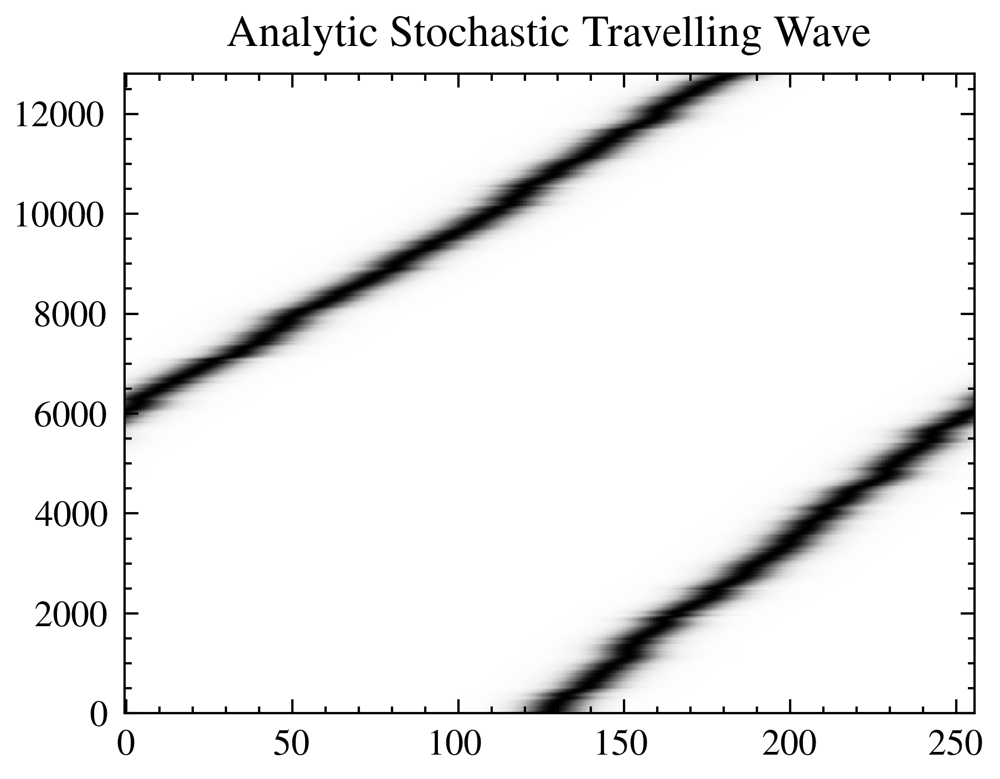

25600


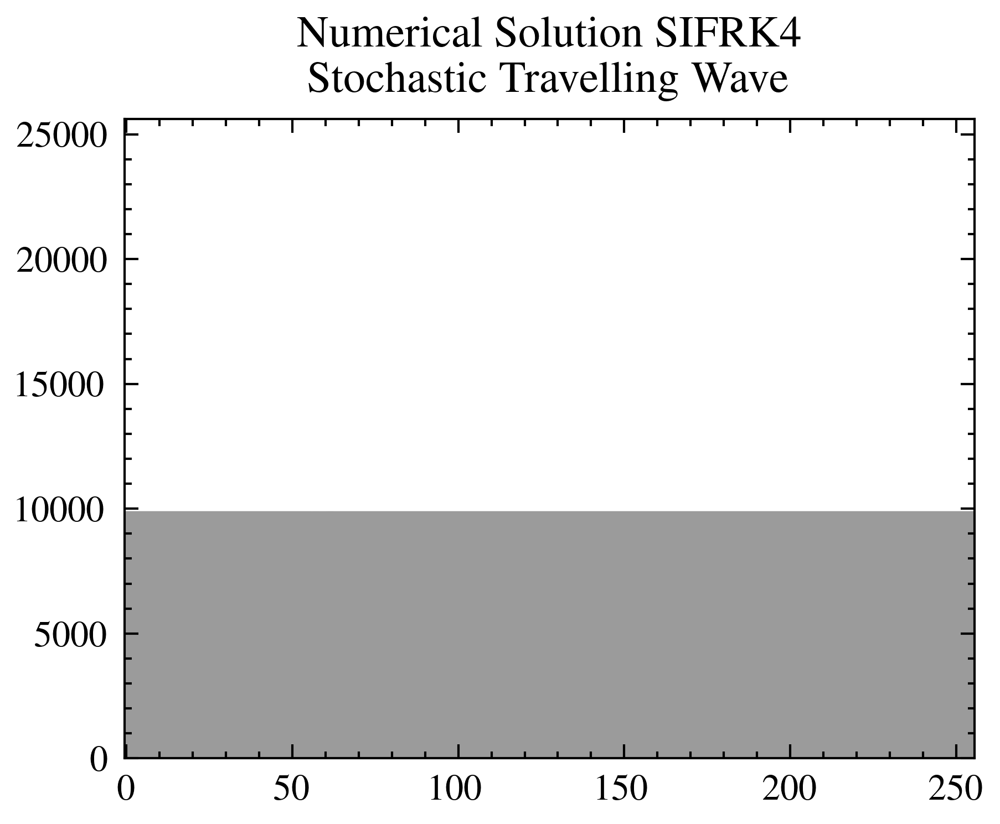

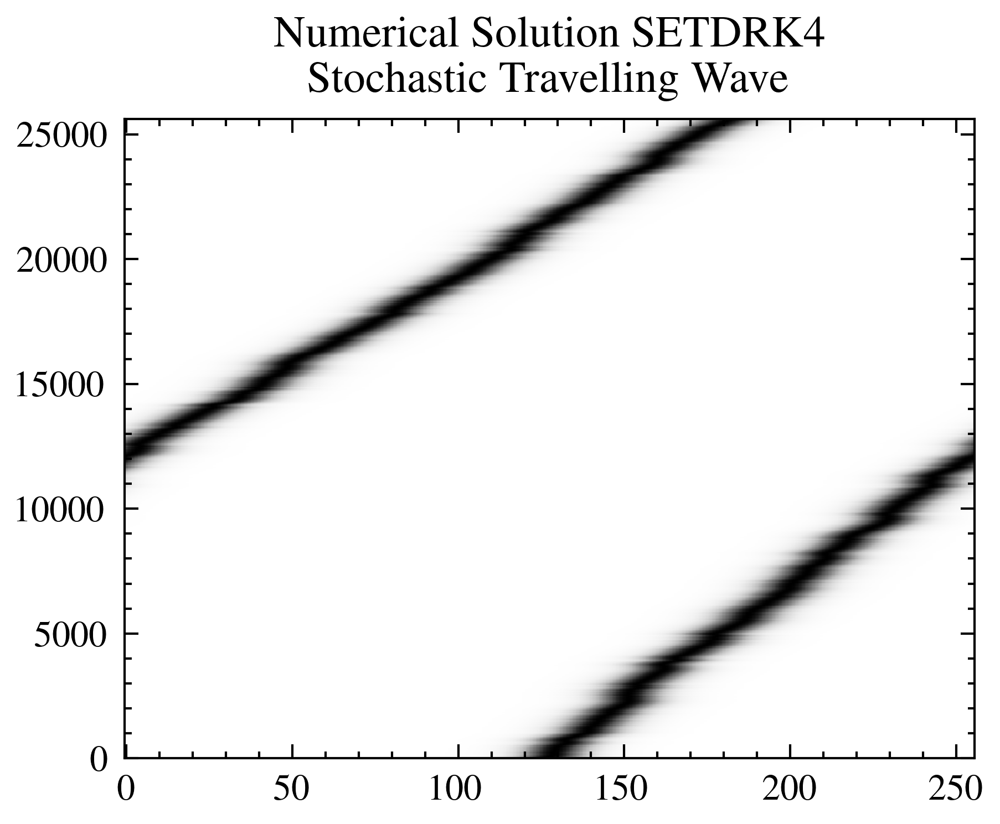

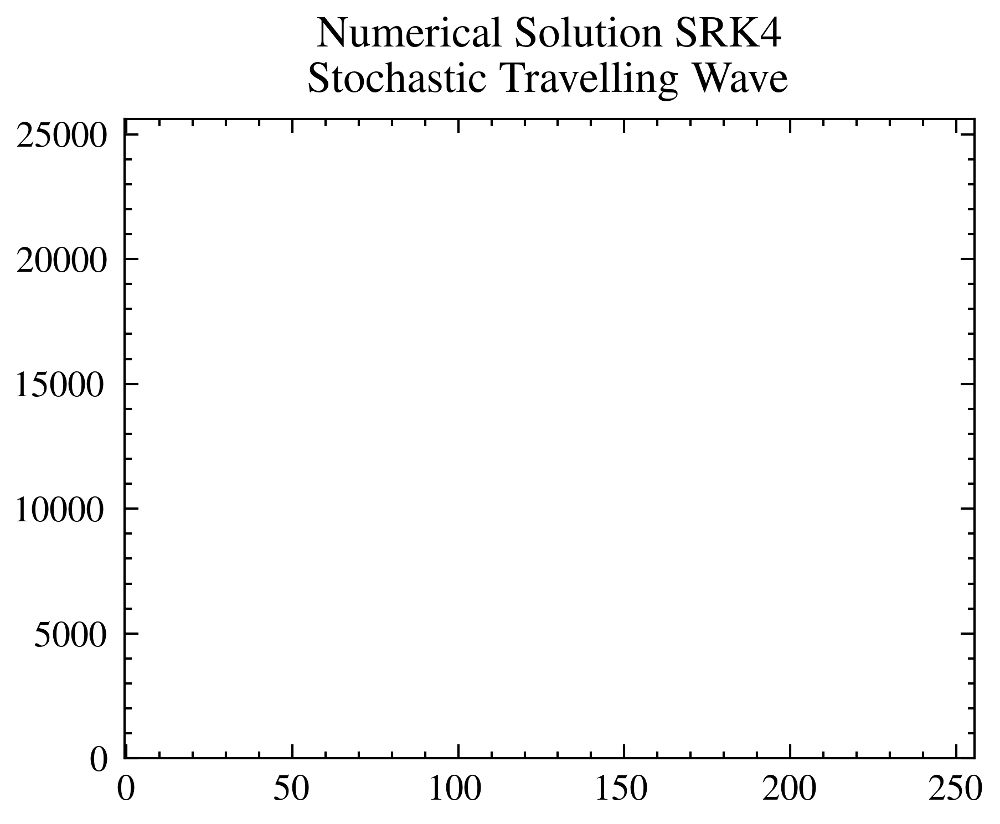

dt: 3.90625e-06 nt 25600 Tmax 0.1
array: [nan nan nan nan nan nan nan nan nan  0.  0.  0.] [7.38929063e-01 5.06382435e-01 9.93832494e-02 8.58759040e-03
 7.62090723e-04 8.80267685e-05 1.24289584e-05 2.26390147e-06
 4.54317639e-07 0.00000000e+00 0.00000000e+00 0.00000000e+00] [nan nan nan nan nan nan nan nan nan  0.  0.  0.]


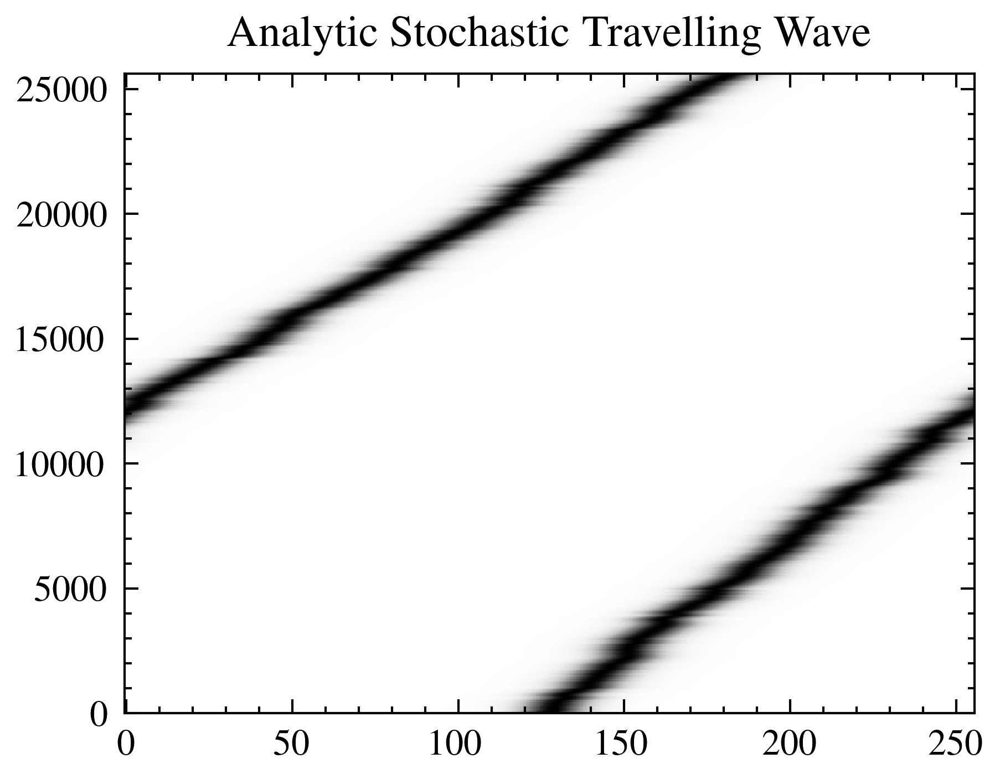

51200


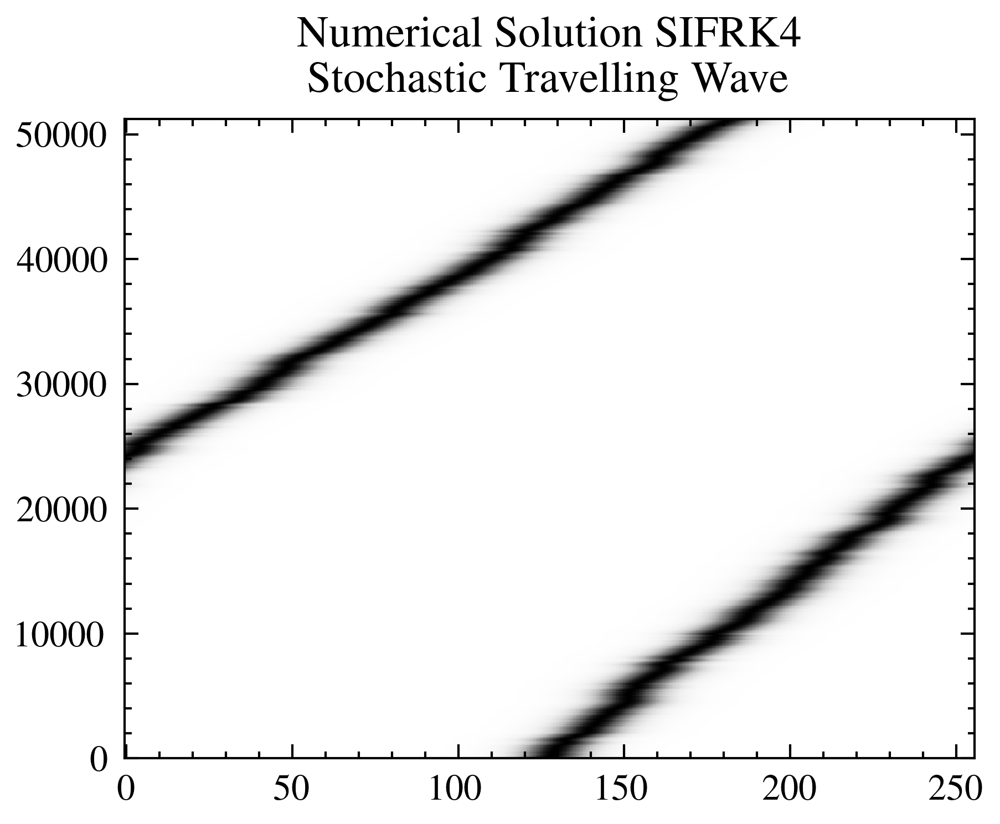

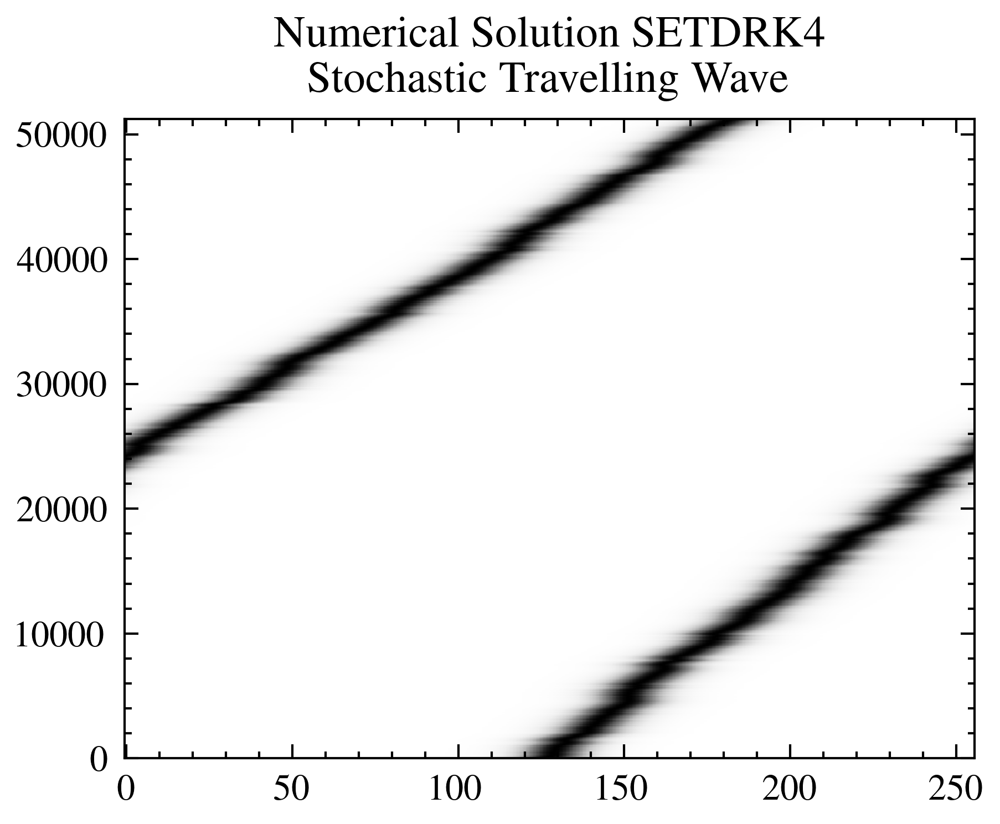

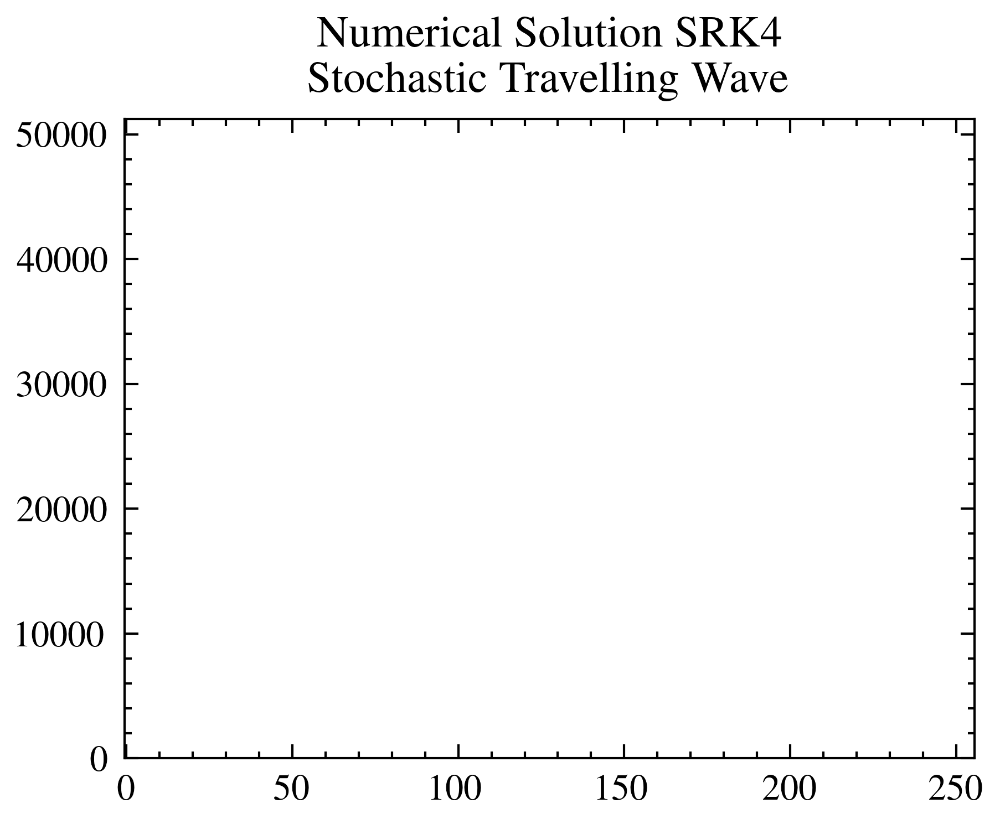

dt: 1.953125e-06 nt 51200 Tmax 0.1
array: [       nan        nan        nan        nan        nan        nan
        nan        nan        nan 0.00053038 0.         0.        ] [7.38929063e-01 5.06382435e-01 9.93832494e-02 8.58759040e-03
 7.62090723e-04 8.80267685e-05 1.24289584e-05 2.26390147e-06
 4.54317639e-07 9.90242083e-08 0.00000000e+00 0.00000000e+00] [nan nan nan nan nan nan nan nan nan nan  0.  0.]


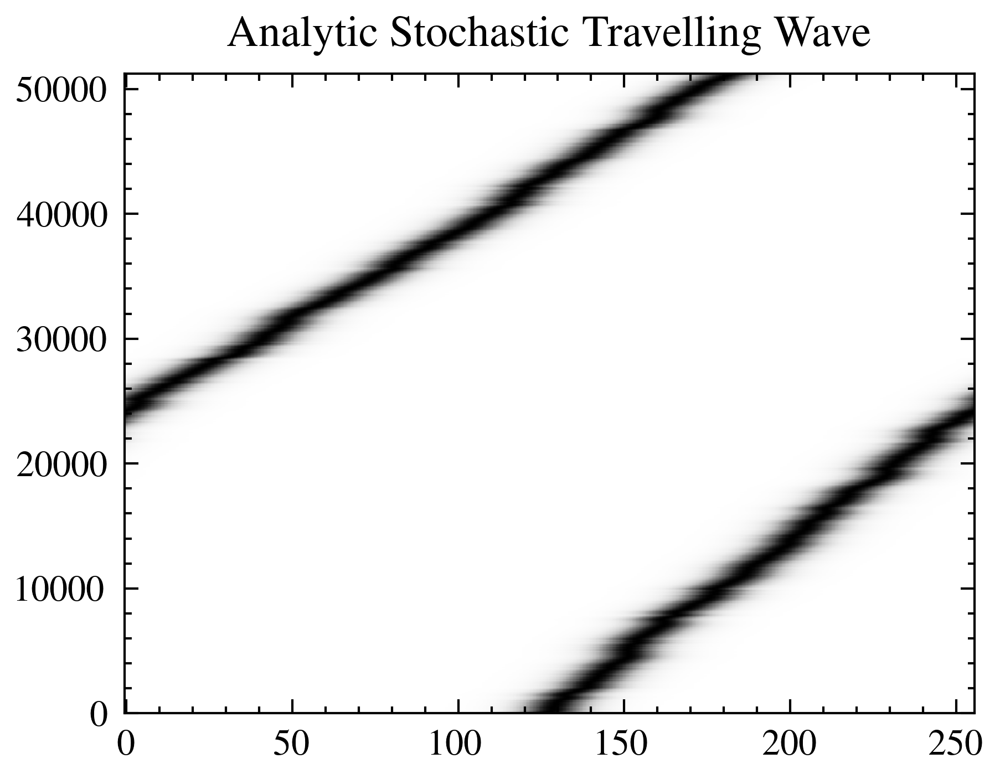

102400


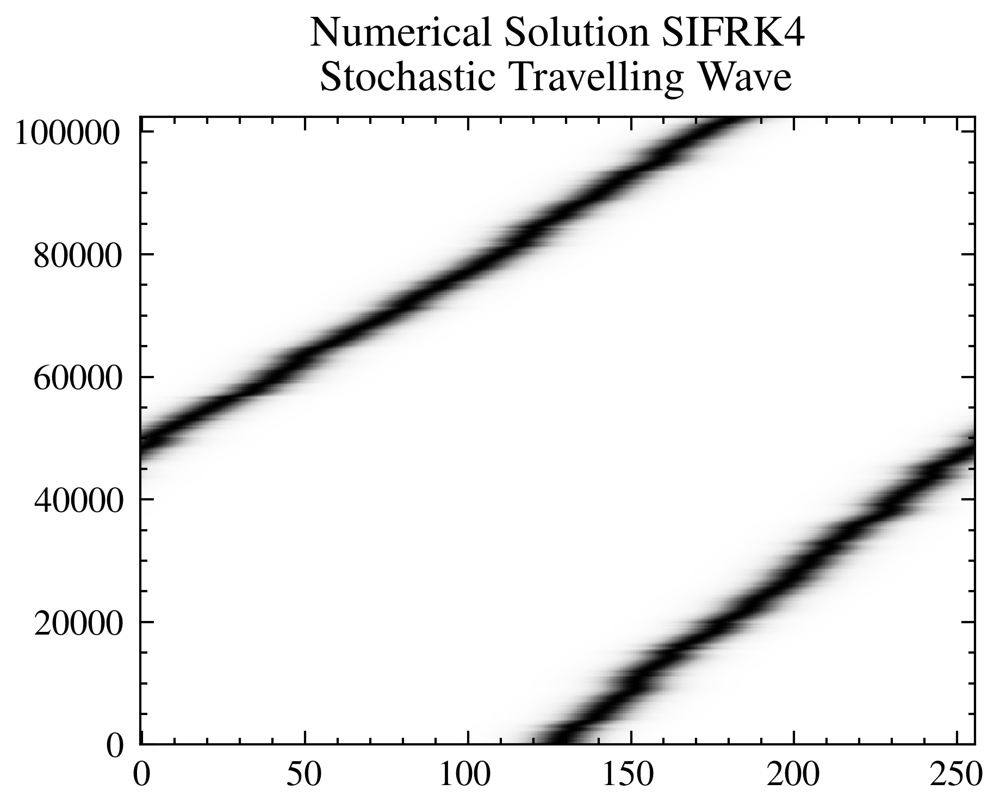

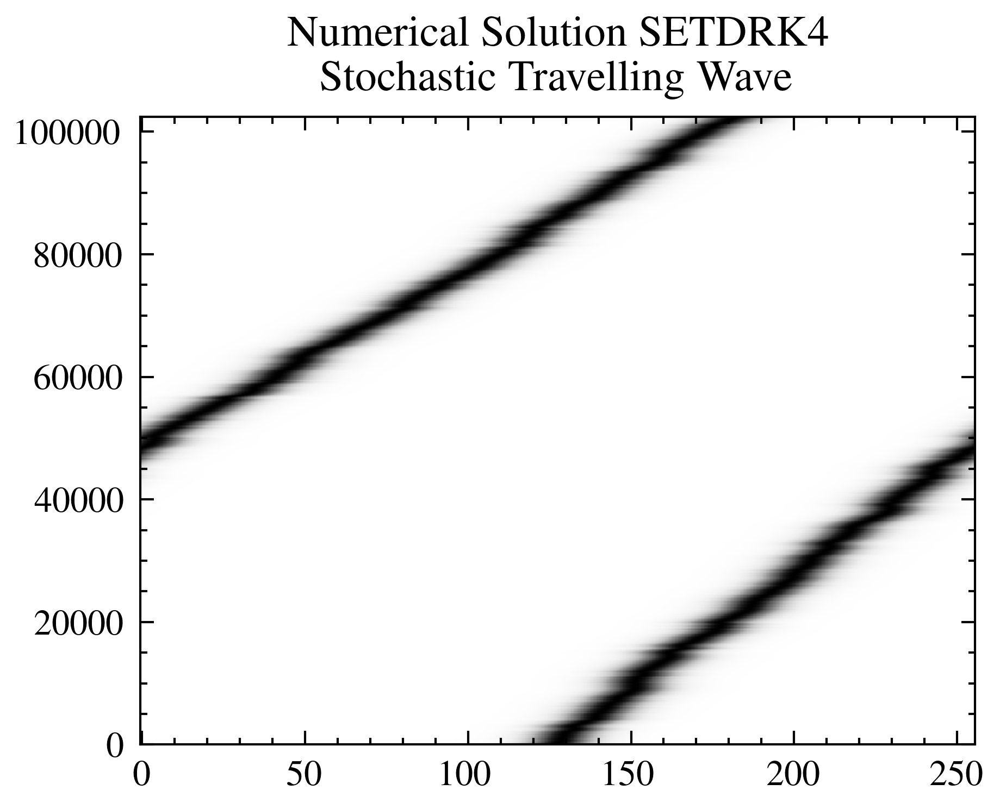

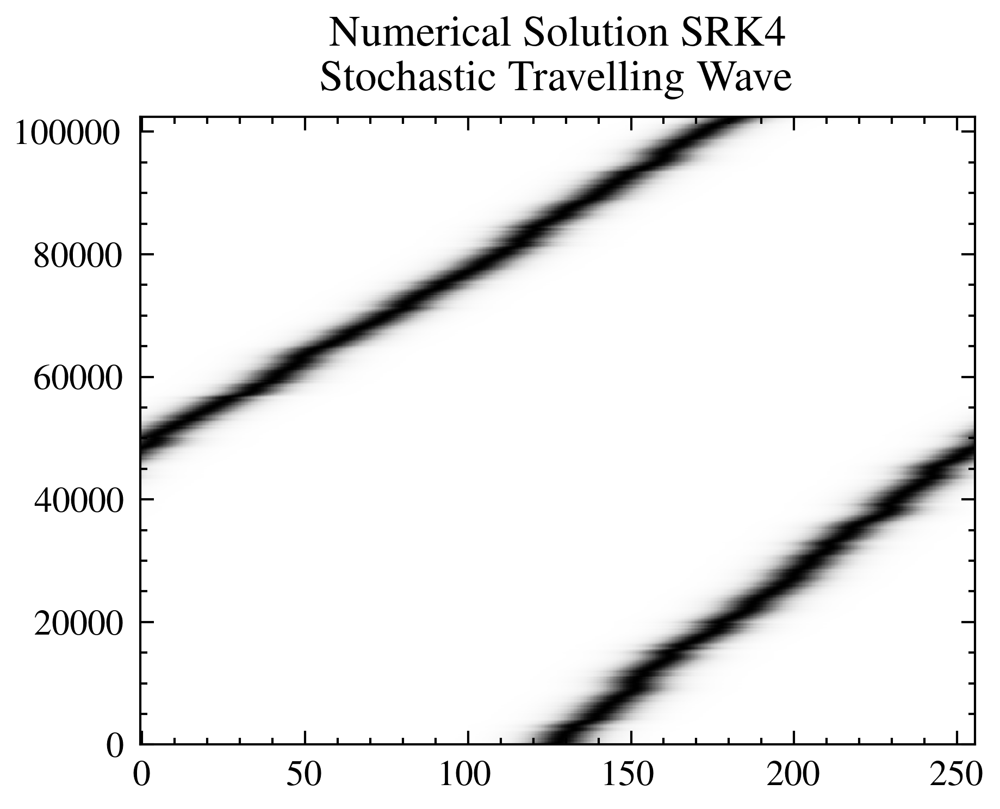

dt: 9.765625e-07 nt 102400 Tmax 0.1
array: [           nan            nan            nan            nan
            nan            nan            nan            nan
            nan 5.30376590e-04 4.84759796e-05 0.00000000e+00] [7.38929063e-01 5.06382435e-01 9.93832494e-02 8.58759040e-03
 7.62090723e-04 8.80267685e-05 1.24289584e-05 2.26390147e-06
 4.54317639e-07 9.90242083e-08 2.39968231e-08 0.00000000e+00] [           nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan 1.54618332e-08 0.00000000e+00]


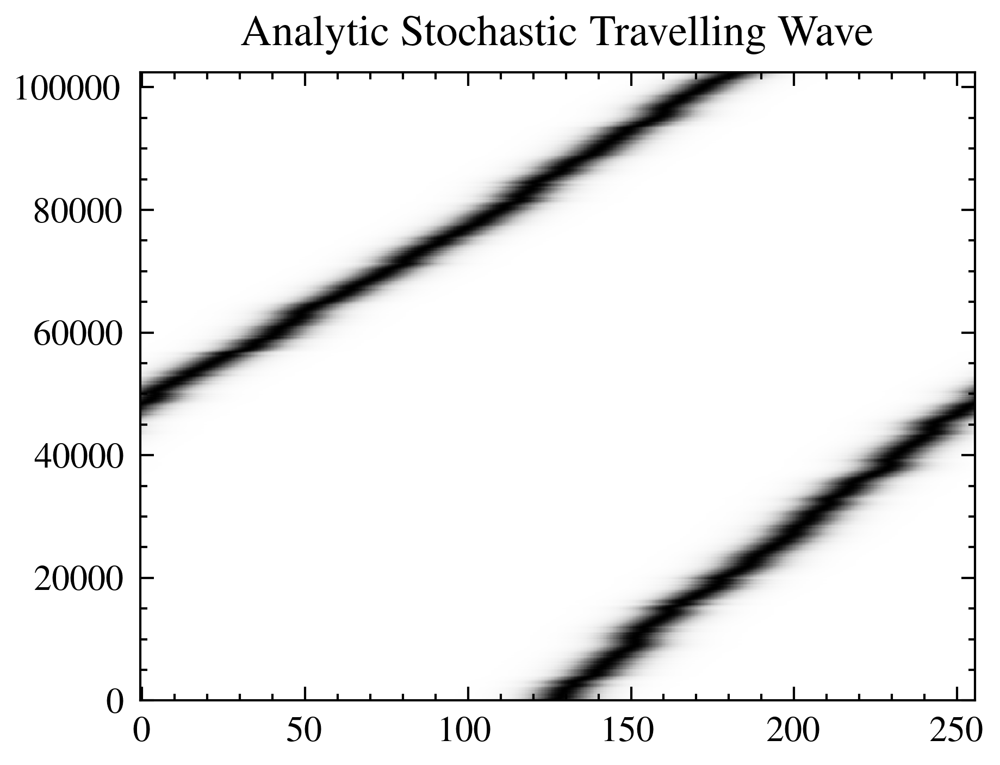

204800


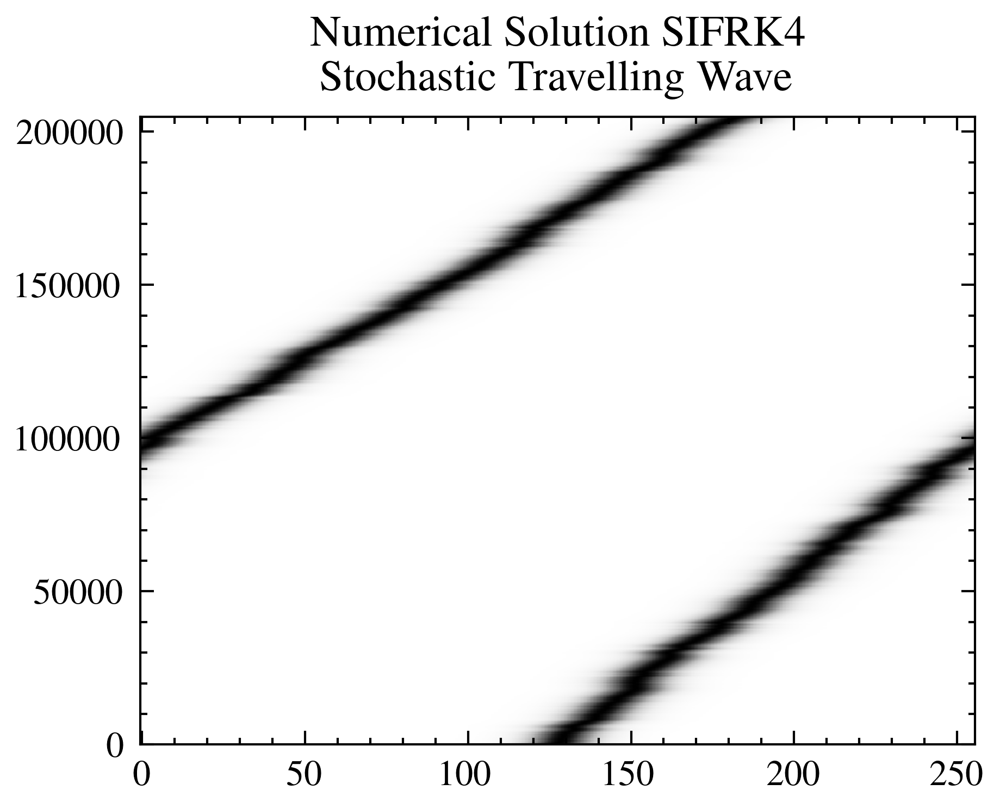

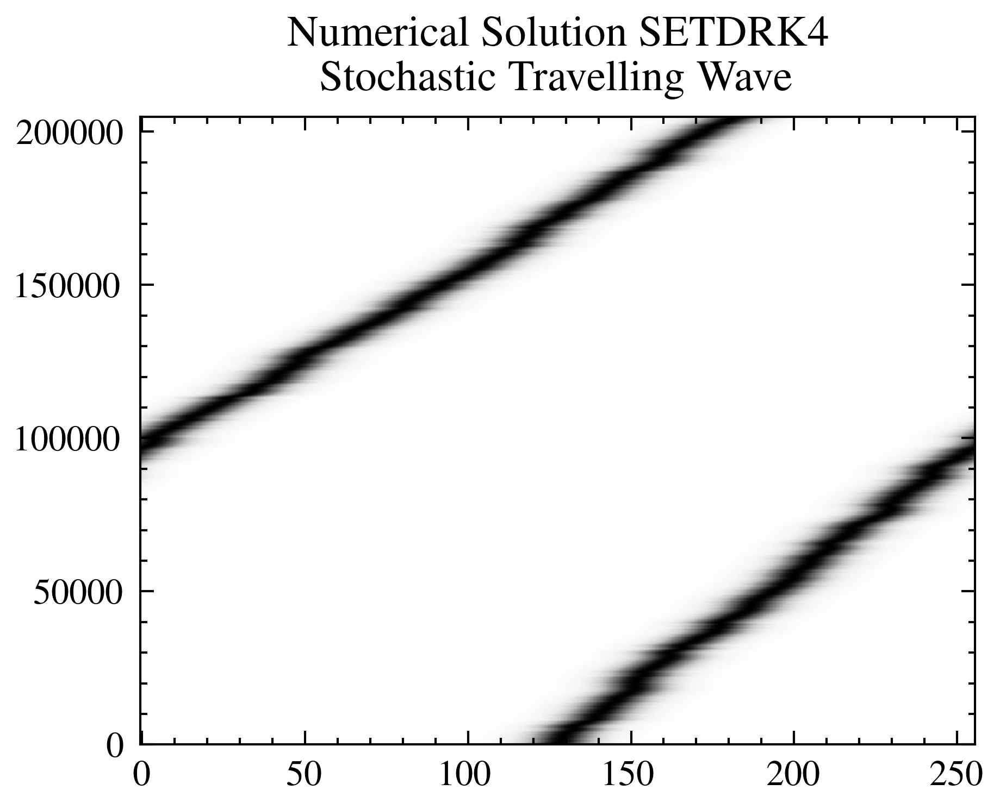

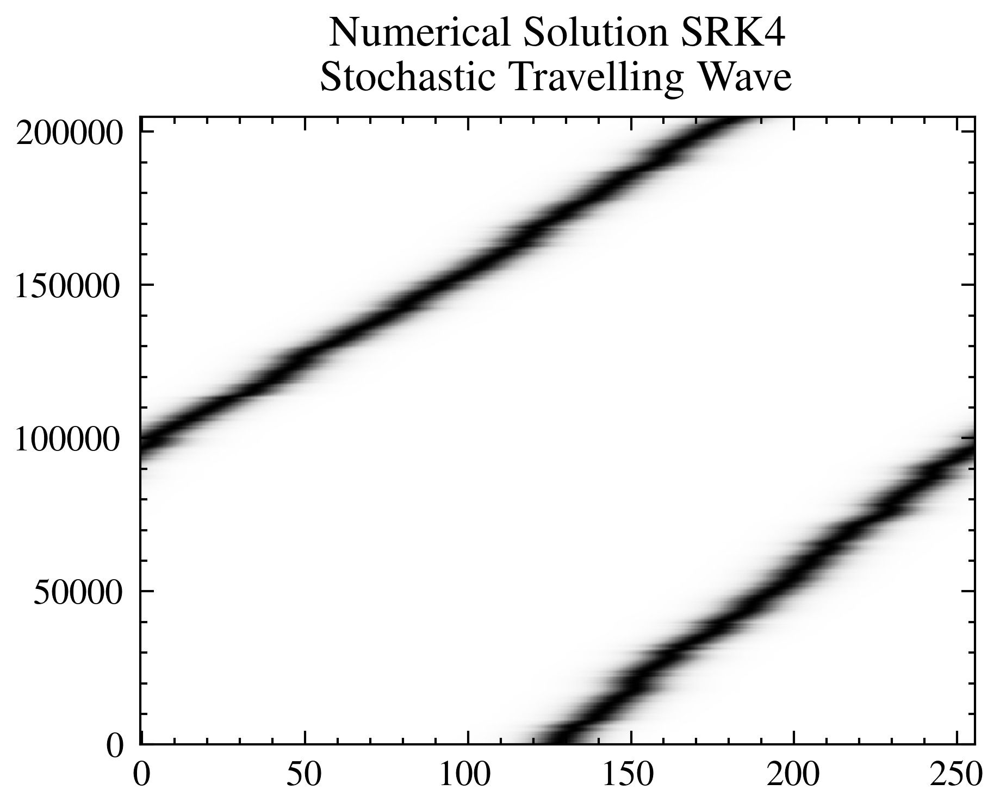

dt: 4.8828125e-07 nt 204800 Tmax 0.1
array: [           nan            nan            nan            nan
            nan            nan            nan            nan
            nan 5.30376590e-04 4.84759796e-05 2.33597639e-05] [7.38929063e-01 5.06382435e-01 9.93832494e-02 8.58759040e-03
 7.62090723e-04 8.80267685e-05 1.24289584e-05 2.26390147e-06
 4.54317639e-07 9.90242083e-08 2.39968231e-08 5.54499624e-09] [           nan            nan            nan            nan
            nan            nan            nan            nan
            nan            nan 1.54618332e-08 3.62351820e-09]


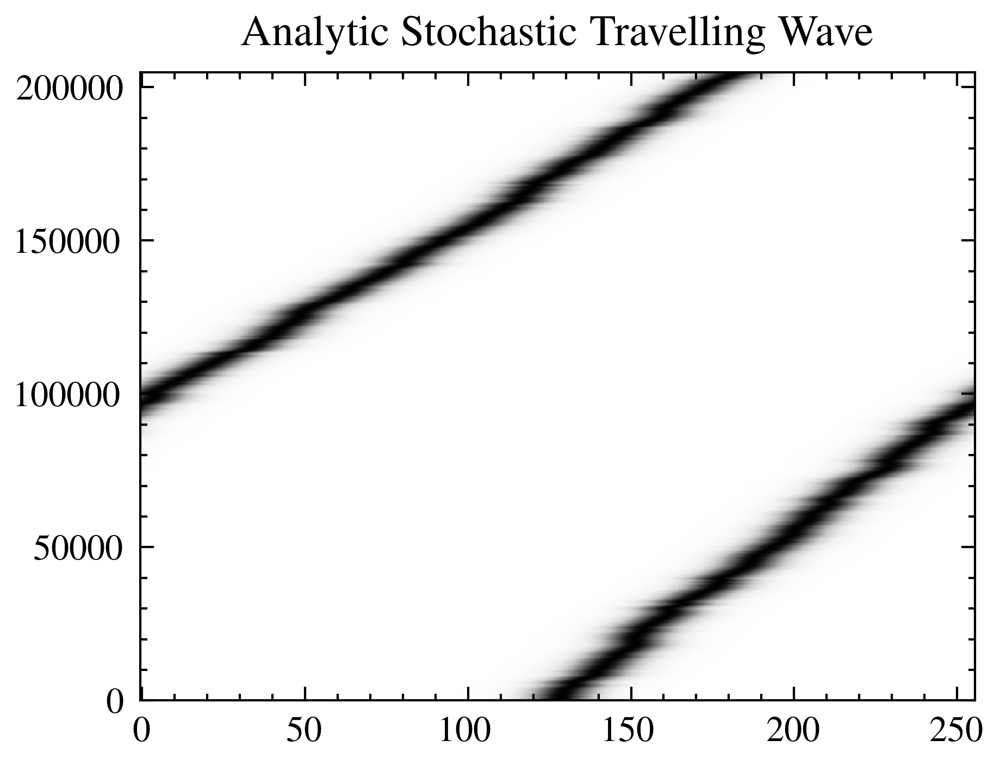

In [135]:
max_number = 12
array = jnp.zeros(max_number)
array2 = jnp.zeros(max_number)
array3 = jnp.zeros(max_number)
for i in range(max_number):
    signal_params = ConfigDict(KDV_params_exact_traveling)
    signal_params.update(E=1,method='Dealiased_IFSRK4',dt= 1e-3*1/2**i,tmax=0.1,nx=256,P=1,S=0,noise_magnitude=1,initial_condition='very_steep_traveling_wave')
    signal_model = ETD_KT_CM_JAX_Vectorised(signal_params)
    
    signal_params_2 = ConfigDict(KDV_params_exact_traveling)
    signal_params_2.update(E=1,method='Dealiased_SETDRK4',dt= 1e-3*1/2**i,tmax=0.1,nx=256,P=1,S=0,noise_magnitude=1,initial_condition='very_steep_traveling_wave')
    signal_model_2 = ETD_KT_CM_JAX_Vectorised(signal_params_2)

    signal_params_3 = ConfigDict(KDV_params_exact_traveling)
    signal_params_3.update(E=1,method='Dealiased_RK4',dt= 1e-3*1/2**i,tmax=0.1,nx=256,P=1,S=0,noise_magnitude=1,initial_condition='very_steep_traveling_wave')
    signal_model_3 = ETD_KT_CM_JAX_Vectorised(signal_params_3)

    initial_signal = initial_condition(signal_model.x, signal_params.E, signal_params.initial_condition)
    # key1 = jax.random.PRNGKey(0)
    # dW = jax.random.normal(key1, shape=(signal_model.nmax, signal_model.params.E, signal_model.params.P))
    # dW = dW
    dW = dW_refine[i] / jnp.sqrt(2**(max_number-i))# rescale to unit normal as required by integrator.
    nmax = signal_model.nmax
    print(nmax)
    final, all = signal_model.run(initial_signal, signal_model.nmax, dW) #the final input is scan length? 
    final2, all2 = signal_model_2.run(initial_signal, signal_model.nmax, dW)
    final3, all3 = signal_model_3.run(initial_signal, signal_model.nmax, dW)
    
    signal = jnp.concatenate([initial_signal[None,...], all], axis=0)
    signal2 = jnp.concatenate([initial_signal[None,...], all2], axis=0)
    signal3 = jnp.concatenate([initial_signal[None,...], all3], axis=0)

    plt.imshow(signal[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Numerical Solution SIFRK4\n Stochastic Travelling Wave')
    plt.show()
    plt.imshow(signal2[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Numerical Solution SETDRK4\n Stochastic Travelling Wave')
    plt.show()
    plt.imshow(signal3[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Numerical Solution SRK4\n Stochastic Travelling Wave')
    plt.show()

    W = jnp.cumsum(dW, axis=0)
    W = jnp.sqrt(signal_model.params.dt) * signal_model.params.noise_magnitude * W
    W_new = jnp.zeros([signal_model.nmax+1, signal_model.params.E, signal_model.params.P])
    W_new = W_new.at[1:,:,:].set(W)

    E = signal_model.params.E
    nmax = signal_model.nmax
    nx = signal_model.params.nx
    x = signal_model.x
    xmax = signal_model.params.xmax
    xmin = signal_model.params.xmin
    dt = signal_model.params.dt
    tmax = signal_model.params.tmax
    print('dt:',dt,'nt',nmax,'Tmax',tmax)
    analytic = jnp.zeros([nmax+1, E, nx])


    initial_condition_jitted = jax.jit(initial_condition, static_argnums=(1,2))# jitted with last two arguments frozen    
    def compute_ans(n, x, dt, W_new, xmax, E, initial_condition):
        return initial_condition_jitted((x - 9 * 9 * (dt * n) - W_new[n, :, :] + xmax) % (xmax * 2) - xmax, E, signal_params.initial_condition)
    
    compute_ans_vmap = vmap(compute_ans, in_axes=(0, None, None, None, None, None, None))
    # Generate the range of n values
    n_values = jnp.arange(signal_model.nmax + 1)
    # Compute analytic using the vectorized function
    analytic = compute_ans_vmap(n_values, x, dt, W_new, xmax, E, signal_params.initial_condition)
        
    plt.imshow(analytic[:,0,:],aspect='auto',cmap='Grays',origin='lower')
    plt.title('Analytic Stochastic Travelling Wave')
    if i==9:
        plt.savefig('/Users/jmw/Documents/GitHub/Particle_Filter/Saving/Analytic_Steep_Travelling_Wave.png',bbox_inches='tight',dpi=300)
    def relative_error(signal, analytic):
        return jnp.linalg.norm(signal-analytic)/jnp.linalg.norm(analytic)
    
    array = array.at[i].set( relative_error(signal[:,:,:], analytic[:,:,:]) )
    array2 = array2.at[i].set( relative_error(signal2[:,:,:], analytic[:,:,:]) )
    array3 = array3.at[i].set( relative_error(signal3[:,:,:], analytic[:,:,:]) )
    print('array:',array,array2,array3)
    plt.show()

[           nan            nan            nan            nan
            nan            nan            nan            nan
            nan 5.30376590e-04 4.84759796e-05 2.33597639e-05]
[7.38929063e-01 5.06382435e-01 9.93832494e-02 8.58759040e-03
 7.62090723e-04 8.80267685e-05 1.24289584e-05 2.26390147e-06
 4.54317639e-07 9.90242083e-08 2.39968231e-08 5.54499624e-09]
(12,)


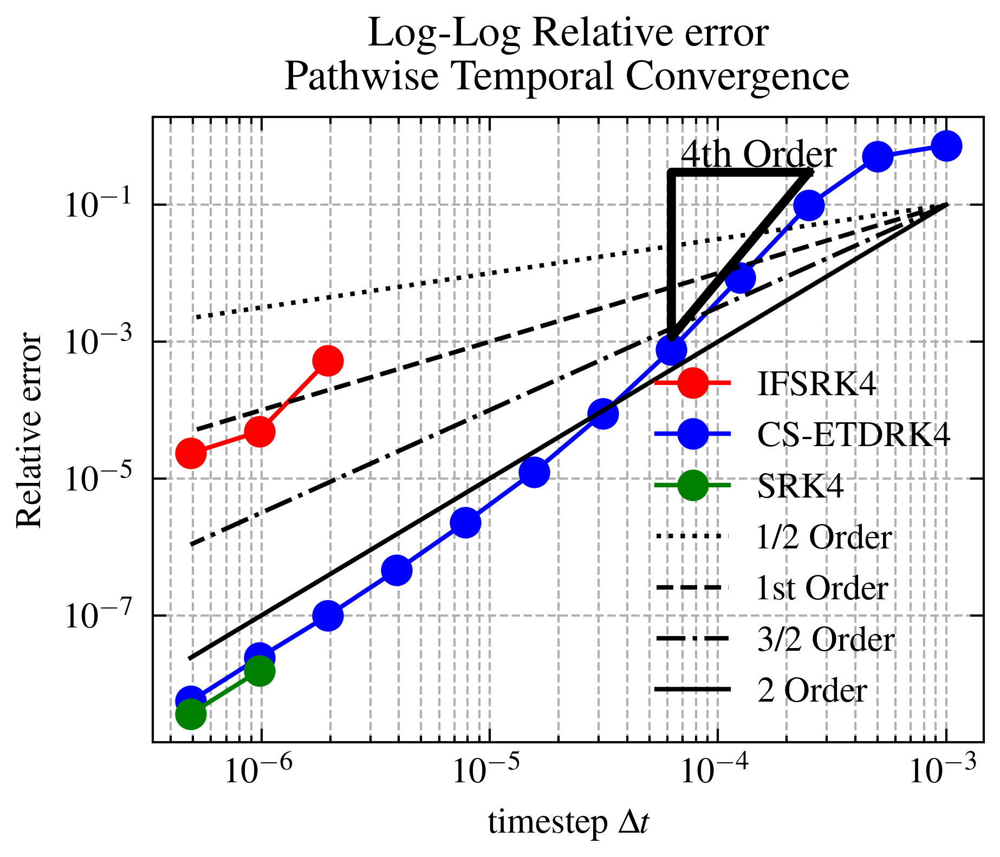

In [152]:
import numpy as np
import matplotlib.pyplot as plt
import scienceplots
plt.style.use(['science','ieee'])
dt = 1e-3*np.asarray([2**-i for i in range(0,max_number)])
values = array
print(values)
print(array2)
print(values.shape)
a = 1e-3
v = 0.1
plt.figure()
#plt.scatter(a,0.1, color='r', label='point')
plt.loglog(dt,values, marker='o', linestyle='-', color='r',label='IFSRK4')
plt.loglog(dt,array2, marker='o', linestyle='-', color='b',label='CS-ETDRK4')
# Plot a 4th order reference line between the 3rd and 5th points of CS-ETDRK4 (array2)
# Plot a triangle to indicate the 4th order slope between the 3rd and 5th points of CS-ETDRK4 (array2)
x0, x1 = dt[2], dt[4]
y0 = array2[2]+0.2
y1 = y0 * (x1 / x0) ** 4
# Draw the triangle
plt.plot([x0, x1, x1, x0], [y0, y0, y1, y0], color='k', linewidth=2,linestyle='solid')
plt.text(x1*1.1, y0*1.2, '4th Order', color='k', fontsize=9)
plt.loglog(dt,array3, marker='o', linestyle='-', color='g',label='SRK4')

plt.loglog(dt,(dt**0.5)/a**0.5*v, linestyle=':', color='k', label=r'1/2 Order')
plt.loglog(dt,dt/a*v, linestyle='--', color='k', label='1st Order')
plt.loglog(dt,(dt**1.5)/a**1.5*v, linestyle='-.', color='k', label='3/2 Order')
plt.loglog(dt,dt**2/a**2*v, linestyle='-', color='k', label='2 Order')

plt.xlabel(r'timestep $\Delta t$')
plt.ylabel('Relative error')
plt.title('Log-Log Relative error \n Pathwise Temporal Convergence')
plt.grid(True, which="both", ls="--")
plt.legend()
plt.savefig('/Users/jmw/Documents/GitHub/Particle_Filter/Saving/Temporal_convergence_RK4_IFRK4_ETDRK4.png',bbox_inches='tight',dpi=300)
plt.show()